### Plots, loading from /g/data temp files


In [1]:
#Load required packages
%matplotlib inline
import matplotlib.pyplot as plt
import xarray as xr
from xgcm import Grid
import numpy as np
import pandas as pd
import cftime
import IPython.display
import cmocean as cm
import cartopy.crs as ccrs
import cartopy.feature as cft
import sys, os
import warnings
warnings.simplefilter("ignore")
from dask.distributed import Client

from xhistogram.xarray import histogram


In [2]:
client = Client(n_workers=8)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 8
Total threads: 16,Total memory: 44.92 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42851,Workers: 8
Dashboard: /proxy/8787/status,Total threads: 16
Started: Just now,Total memory: 44.92 GiB
Comm: tcp://127.0.0.1:34031,Total threads: 2
Dashboard: /proxy/44465/status,Memory: 5.62 GiB
Nanny: tcp://127.0.0.1:37427,


In [3]:
## load stuff for grid info

# files:
base = '/g/data/hh5/tmp/cy8964/access-om2/archive/025deg_jra55_ryf/';
xch = 1440#2*288
ych = 1080#2*216

fgrd   = xr.open_dataset(base + 'output096/ocean/ocean_grid.nc').chunk({'yt_ocean':ych/10,'yu_ocean':ych/10,'xt_ocean':xch/10,'xu_ocean':xch/10})
fwmass_mean = xr.open_mfdataset(base +'output096/ocean/ocean_wmass_mean.nc').chunk({'grid_yt_ocean':ych/10,'grid_yu_ocean':ych/10,'grid_xt_ocean':xch/10})
fmonth_mean = xr.open_mfdataset(base +'output096/ocean/ocean_month_mean.nc').chunk({'yt_ocean':ych/10,'yu_ocean':ych/10,'xt_ocean':xch/10})
fheat_mean = xr.open_mfdataset(base +'output096/ocean/ocean_heat_mean.nc').chunk({'yt_ocean':ych/10,'xt_ocean':xch/10})

# load RYF monthly data
base_msc = '/g/data/hh5/tmp/cy8964/access-om2/archive/025deg_jra55_ryf/'
# ---------------------------------------------------------------------------------- #
# load in data set ----------------------------------------------------------------- #
fmonth_m = xr.open_mfdataset(base_msc+'output096/ocean/ocean_month.nc',combine='by_coords',chunks={'time': 1},decode_times = True).chunk({'time': 1,'yt_ocean':ych/10,'xt_ocean':xch/10})
fheat_m = xr.open_mfdataset(base_msc+'output096/ocean/ocean_heat.nc',combine='by_coords',chunks={'time': 1},decode_times = True).chunk({'time': 1,'yt_ocean':ych/10,'xt_ocean':xch/10})
fwmass_m = xr.open_mfdataset(base_msc+'output096/ocean/ocean_wmass.nc',combine='by_coords',chunks={'time': 1},decode_times = True).chunk({'time': 1,'grid_yt_ocean':ych/10,'grid_xt_ocean':xch/10})

# load RYF daily data
base_msc = '/g/data/hh5/tmp/cy8964/access-om2/archive/025deg_jra55_ryf/'
# ---------------------------------------------------------------------------------- #
# load in data set ----------------------------------------------------------------- #
fdaily = xr.open_mfdataset(base_msc+'output096/ocean/ocean_daily.nc',combine='by_coords',chunks={'time': 1},decode_times = True).chunk({'time': 1,'yt_ocean':ych/10,'xt_ocean':xch/10})
fheat_daily = xr.open_mfdataset(base_msc+'output096/ocean/ocean_heat_daily.nc',combine='by_coords',chunks={'time': 1},decode_times = True).chunk({'time': 1,'yt_ocean':ych/10,'xt_ocean':xch/10})
fwmass_daily = xr.open_mfdataset(base_msc+'output096/ocean/ocean_wmass_daily.nc',combine='by_coords',chunks={'time': 1},decode_times = True).chunk({'time': 1,'grid_yt_ocean':ych/10,'grid_xt_ocean':xch/10})

# ---------------------------------------------------------------------------------- #

# Generate xgcm grid object:
gridwm = Grid(fwmass_m,coords={"x":{"center":"grid_xt_ocean","right":"grid_xu_ocean"},
                             "y":{"center":"grid_yt_ocean","right":"grid_yu_ocean"},
                             "T":{"center":"neutral","outer":"neutralrho_edges"}},periodic=False)
gridmn = Grid(fmonth_m,coords={"x":{"center":"xt_ocean"},
                             "y":{"center":"yt_ocean","right":"yu_ocean"},
                             "z":{"center":"st_ocean","outer":"st_edges_ocean"}},periodic=False)
gridht = Grid(fheat_m,coords={"x":{"center":"xt_ocean"},
                             "y":{"center":"yt_ocean"},
                             "z":{"center":"st_ocean","outer":"st_edges_ocean"}},periodic=False)
gridd = Grid(fdaily,coords={"x":{"center":"xt_ocean"},
                             "y":{"center":"yt_ocean","right":"yu_ocean"},
                             "z":{"center":"st_ocean","outer":"st_edges_ocean"}},periodic=False)
grid2 = Grid(fgrd,coords={"x":{"center":"xt_ocean","right":"xu_ocean"},
                             "y":{"center":"yt_ocean","right":"yu_ocean"}},periodic=False)

# ---------------------------------------------------------------------------------- #

# Some constants:
Cp = 3992.10322329649
rho0 = 1035
dT = (fwmass_m.neutral[1]-fwmass_m.neutral[0]).values

sc_daylength = [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]

area = fgrd.area_t.rename({'xt_ocean':'grid_xt_ocean','yt_ocean':'grid_yt_ocean'})
dy = gridmn.diff(fgrd.yu_ocean,'y',boundary='extend').rename({'yt_ocean':'grid_yt_ocean'})
dx = grid2.diff(fgrd.xu_ocean,'x',boundary='extend').rename({'xt_ocean':'grid_xt_ocean'})
dyt = gridmn.diff(fgrd.yu_ocean,'y',boundary='extend')
dxt = grid2.diff(fgrd.xu_ocean,'x',boundary='extend')

### Load 3d (x,y,temp) data separated by timescale

In [4]:
True_1year_means = xr.open_mfdataset('/g/data/e14/cy8964/Post_Process/temp/025deg_096_3d/True_1year_means_corrected.nc').chunk({'grid_yu_ocean':ych/10,'grid_yt_ocean':ych/10, 'grid_xt_ocean':xch/10})
Mean_1year_means = xr.open_mfdataset('/g/data/e14/cy8964/Post_Process/temp/025deg_096_3d/Mean_1year_means.nc').chunk({'grid_yu_ocean':ych/10,'grid_yt_ocean':ych/10, 'grid_xt_ocean':xch/10})
Twomo_mean_1year_means = xr.open_mfdataset('/g/data/e14/cy8964/Post_Process/temp/025deg_096_3d/2mo_mean_1year_means.nc').chunk({'grid_yu_ocean':ych/10,'grid_yt_ocean':ych/10, 'grid_xt_ocean':xch/10})
Tenday_mean_1year_means = xr.open_mfdataset('/g/data/e14/cy8964/Post_Process/temp/025deg_096_3d/10day_mean_1year_means.nc').chunk({'grid_yu_ocean':ych/10,'grid_yt_ocean':ych/10, 'grid_xt_ocean':xch/10})
Oneday_mean_1year_means = xr.open_mfdataset('/g/data/e14/cy8964/Post_Process/temp/025deg_096_3d/1day_mean_1year_means.nc').chunk({'grid_yu_ocean':ych/10,'grid_yt_ocean':ych/10,'grid_xt_ocean':xch/10})

True_10year_means = xr.open_mfdataset('/g/data/e14/cy8964/Post_Process/temp/025deg_10yr_3d/True_10year_means.nc').chunk({'grid_yu_ocean':ych/10,'grid_yt_ocean':ych/10, 'grid_xt_ocean':xch/10})
Mean_10year_means = xr.open_mfdataset('/g/data/e14/cy8964/Post_Process/temp/025deg_10yr_3d/Mean_10year_means.nc').chunk({'grid_yu_ocean':ych/10,'grid_yt_ocean':ych/10, 'grid_xt_ocean':xch/10})
Twomo_mean_10year_means = xr.open_mfdataset('/g/data/e14/cy8964/Post_Process/temp/025deg_10yr_3d/2mo_mean_10year_means.nc').chunk({'grid_yu_ocean':ych/10,'grid_yt_ocean':ych/10, 'grid_xt_ocean':xch/10})
sc_Twomo_mean_10year_means = xr.open_mfdataset('/g/data/e14/cy8964/Post_Process/temp/025deg_10yr_3d/sc_2mo_mean_10year_means.nc').chunk({'grid_yu_ocean':ych/10,'grid_yt_ocean':ych/10, 'grid_xt_ocean':xch/10})


### Zonal Mean Plots

In [8]:
def plot_decomp_3d_to_2d(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar, SFcbar2, MXcbar2, title):
    
    plt.figure(figsize=(45,20),facecolor='w')
    Hf = -Cp*rho0*dT*gridwm.cumsum(DataSet.Psi,'T',boundary="fill", fill_value=0)

    cmap = 'coolwarm'

    plt.subplot(3,7,1)
    (DataSet.Psi.sum('grid_xt_ocean').where(maskPsi==1.)/1.e6).plot.contourf(levels=Psicbar,x='grid_yu_ocean',cbar_kwargs={'label':'Sv'},cmap=cmap)
    plt.title('Streamfunction', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,2)
    (Hf.sum('grid_xt_ocean').where(maskHf==1.)/1.e15).plot.contourf(levels=Hfcbar,x='grid_yu_ocean',cbar_kwargs={'label':'PW'},cmap=cmap)
    plt.title('Heat Function', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,8)
    (DataSet.SF.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('Surface Forcing', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,9)
    (DataSet.temp_vdiffuse_sbc.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_sbc', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,10)
    (DataSet.sw_heat.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar2,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('Shortwave', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,11)
    (DataSet.frazil_3d.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar2,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('Frazil', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,12)
    ((DataSet.SF-DataSet.sw_heat-DataSet.frazil_3d-DataSet.temp_vdiffuse_sbc).sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar2,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('sfc_hflux_pme', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    
    plt.subplot(3,7,15)
    ((DataSet.MX).sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('Vertical Mixing', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,16)
    ((DataSet.temp_vdiffuse_diff_cbt_kppbl).sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_kppbl', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,17)
    temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
           DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
           DataSet.temp_vdiffuse_diff_cbt_kppish
    ((temp).sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_nonlocal_KPP', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,18)
    ((DataSet.temp_vdiffuse_diff_cbt_kppish).sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar2,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_kppish', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,19)
    ((DataSet.temp_vdiffuse_diff_cbt_kppicon).sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar2,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_kppicon', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')


    plt.subplot(3,7,20)
    ((DataSet.temp_vdiffuse_diff_cbt_kppdd).sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar2,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_kppdd', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    plt.subplot(3,7,21)
    ((DataSet.temp_vdiffuse_diff_cbt_wave).sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar2,x='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_wave', fontsize = 20)
    plt.ylabel('Temperature (degrees C)')
    plt.xlabel('Latitude (degrees N)')

    
    
    plt.suptitle(title, fontsize = 18)
    plt.show()

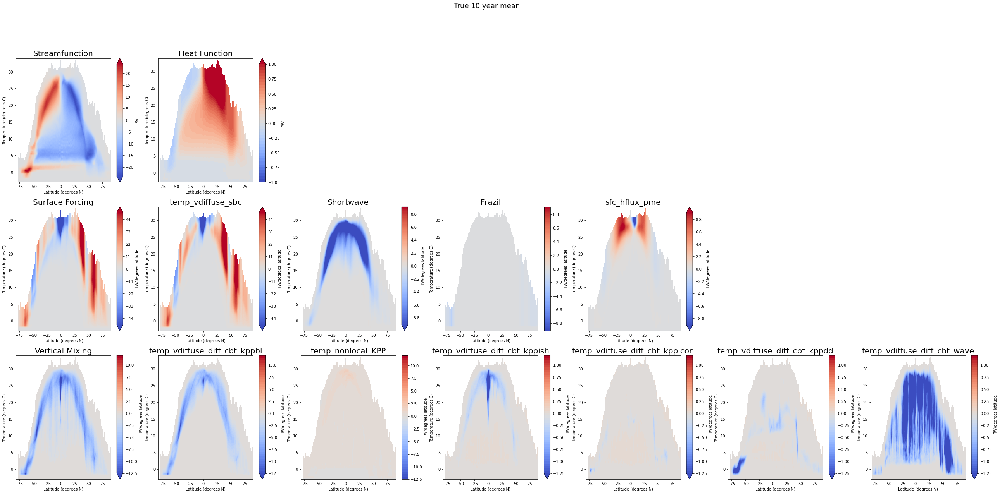

In [9]:
DataSet = True_10year_means
# masking:
maskPsi = 0*True_10year_means.Psi.sum('grid_xt_ocean').where(True_10year_means.Psi.sum('grid_xt_ocean')!=True_10year_means.Psi.sum('grid_xt_ocean').isel(neutralrho_edges=-1))+1.
maskHf = gridwm.interp(maskPsi,'T')
maskSF = gridwm.interp(maskPsi,'y',boundary="fill",fill_value=0.)
maskSF

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-25.,25.,1.)/2
plot_decomp_3d_to_2d(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar,SFcbar/5, MXcbar/10, 'True 10 year mean')

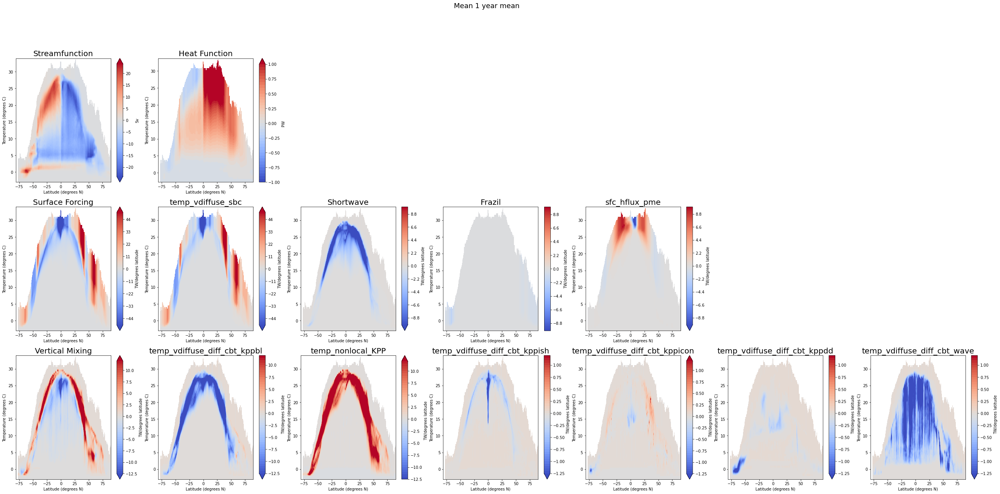

In [11]:
DataSet = Mean_10year_means

Hf = -Cp*rho0*dT*gridwm.cumsum(DataSet.Psi,'T',boundary="fill", fill_value=0)


Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-25.,25.,1.)/2

plot_decomp_3d_to_2d(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar,SFcbar/5, MXcbar/10,  'Mean 10 year mean')

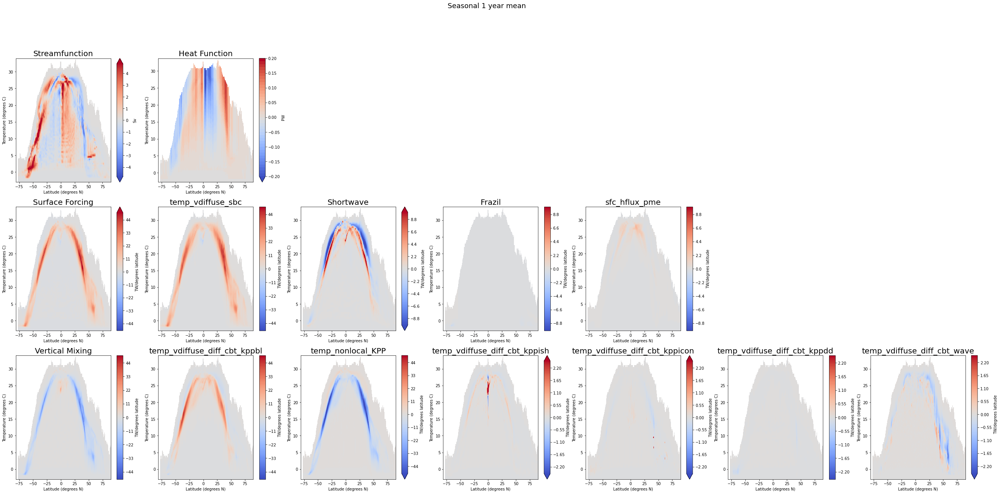

In [28]:
DataSet = sc_Twomo_mean_1year_means - Mean_1year_means

Hf = -Cp*rho0*dT*gridwm.cumsum(DataSet.Psi,'T',boundary="fill", fill_value=0)

Psicbar = np.arange(-24.,24.5,0.5)/5
Hfcbar = np.arange(-1.,1.05,0.05)/5
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-50.,51.,1.)

cmap = 'coolwarm'

plot_decomp_3d_to_2d(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar,SFcbar/5, MXcbar/20,  'Seasonal 10 year mean')

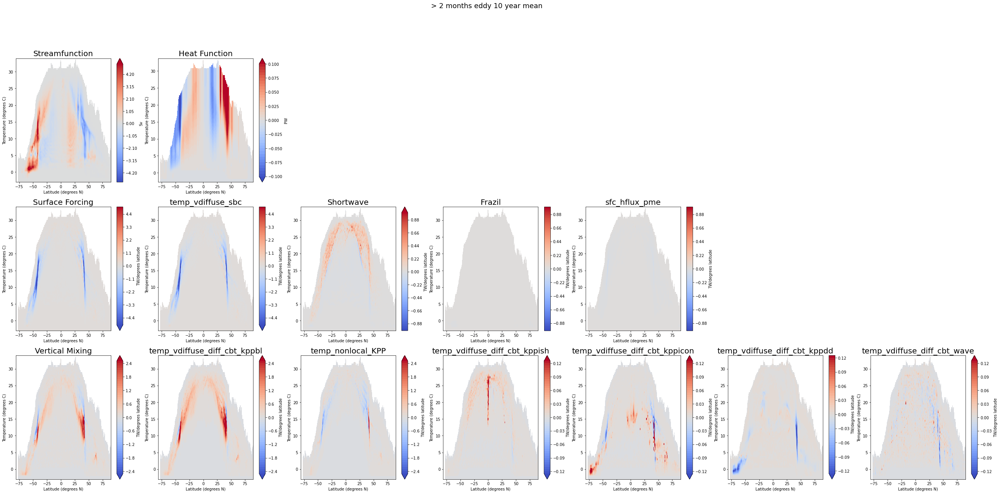

In [10]:
DataSet = Twomo_mean_10year_means - sc_Twomo_mean_10year_means

Hf = -Cp*rho0*dT*gridwm.cumsum(DataSet.Psi,'T',boundary="fill", fill_value=0)

Psicbar = np.arange(-5.,5.1,0.05)
Hfcbar = np.arange(-0.1,0.105,0.005)
SFcbar = np.arange(-5.,5.1,0.1)
MXcbar = np.arange(-2.5,2.51,0.1)

cmap = 'coolwarm'

plot_decomp_3d_to_2d(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar,SFcbar/5, MXcbar/20,  '> 2 months eddy 10 year mean')

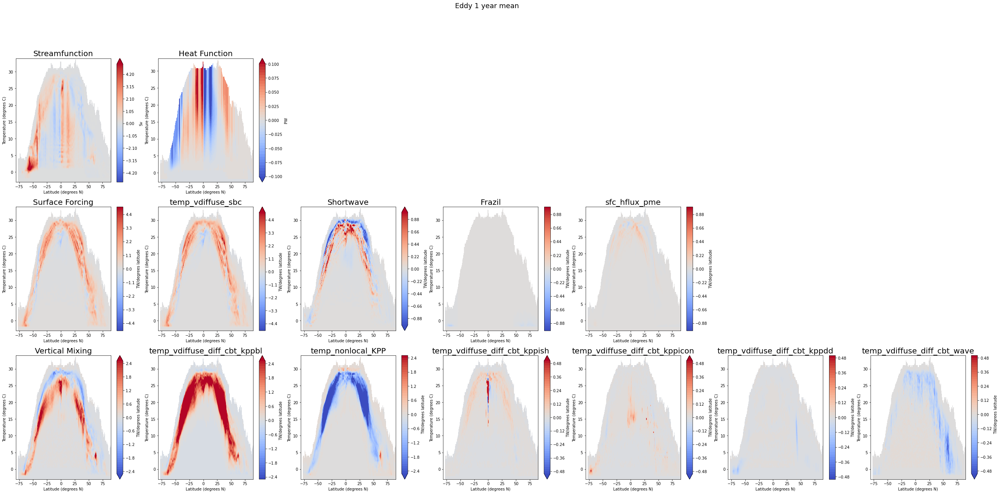

In [14]:

DataSet = Tenday_mean_1year_means - Twomo_mean_1year_means
Hf = -Cp*rho0*dT*gridwm.cumsum(DataSet.Psi,'T',boundary="fill", fill_value=0)

Psicbar = np.arange(-5.,5.1,0.05)
Hfcbar = np.arange(-0.1,0.105,0.005)
SFcbar = np.arange(-5.,5.1,0.1)
MXcbar = np.arange(-2.5,2.51,0.1)

plot_decomp_3d_to_2d(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar,SFcbar/5, MXcbar/10,  'Eddy 1 year mean')

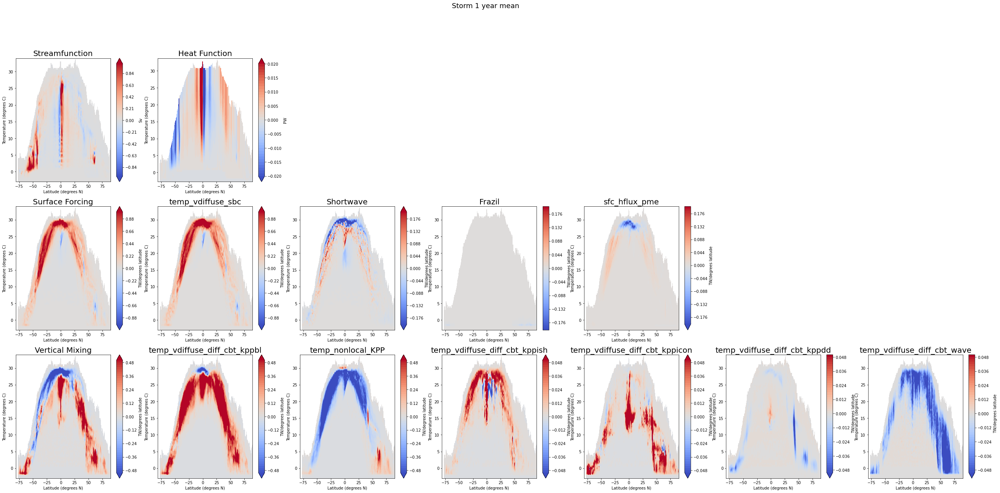

In [13]:
DataSet = Oneday_mean_1year_means - Tenday_mean_1year_means
Hf = -Cp*rho0*dT*gridwm.cumsum(DataSet.Psi,'T',boundary="fill", fill_value=0)

Psicbar = np.arange(-5.,5.1,0.05)/5
Hfcbar = np.arange(-0.1,0.105,0.005)/5
SFcbar = np.arange(-5.,5.1,0.1)/5
MXcbar = np.arange(-2.5,2.51,0.1)/5

plot_decomp_3d_to_2d(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar,SFcbar/5, MXcbar/10,  'Storm 1 year mean')

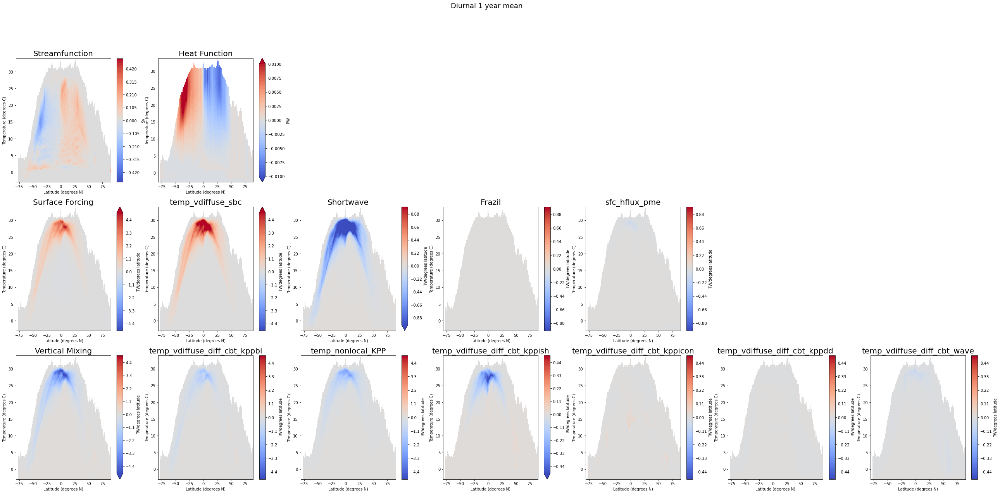

In [27]:
DataSet =  True_1year_means - Oneday_mean_1year_means

Hf = -Cp*rho0*dT*gridwm.cumsum(DataSet.Psi,'T',boundary="fill", fill_value=0)

Psicbar = np.arange(-5.,5.1,0.05)/10
Hfcbar = np.arange(-0.1,0.105,0.005)/10
SFcbar = np.arange(-5.,5.1,0.1)
MXcbar = np.arange(-5.,5.1,0.1)

plot_decomp_3d_to_2d(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar,SFcbar/5, MXcbar/10,  'Diurnal 1 year mean')

## Integrate in latitude direction:

(-80.0, 80.0)

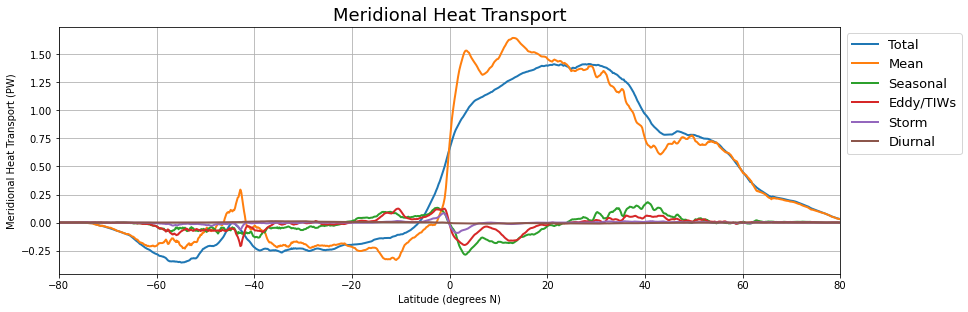

2022-05-06 11:55:26,449 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:26,581 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:26,584 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:26,642 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:26,700 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:26,767 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:26,848 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:26,910 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:27,055 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:27,057 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:27,061 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:27,201 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:27,263 - distributed.nanny - WARNING - Restarting worker
2022-05-06 11:55:27,314 - distributed.

In [21]:
plt.figure(figsize=(14,10))

plt.subplot(2,1,1)
Hf = -Cp*rho0*dT*gridwm.cumsum(True_1year_means.Psi.sum('grid_xt_ocean'),'T',boundary="fill", fill_value=0)
Hf_mean_tot = -Cp*rho0*dT*gridwm.cumsum(Mean_1year_means.Psi.sum('grid_xt_ocean'),'T',boundary="fill", fill_value=0)
Hf_ac = -Cp*rho0*dT*gridwm.cumsum((Twomo_mean_1year_means - Mean_1year_means).Psi.sum('grid_xt_ocean'),'T',boundary="fill", fill_value=0)
Hf_TIWs = -Cp*rho0*dT*gridwm.cumsum((Tenday_mean_1year_means - Twomo_mean_1year_means).Psi.sum('grid_xt_ocean'),'T',boundary="fill", fill_value=0)
Hf_storm = -Cp*rho0*dT*gridwm.cumsum((Oneday_mean_1year_means- Tenday_mean_1year_means).Psi.sum('grid_xt_ocean'),'T',boundary="fill", fill_value=0)
Hf_diurnal = -Cp*rho0*dT*gridwm.cumsum((True_1year_means-Oneday_mean_1year_means).Psi.sum('grid_xt_ocean'),'T',boundary="fill", fill_value=0)

(Hf/1.e15).isel(neutral=-1).plot(label='Total',linewidth=2)
(Hf_mean_tot/1.e15).isel(neutral=-1).plot(label='Mean',linewidth=2)
(Hf_ac/1.e15).isel(neutral=-1).plot(label='Seasonal',linewidth=2)
(Hf_TIWs/1.e15).isel(neutral=-1).plot(label='Eddy/TIWs',linewidth=2)
(Hf_storm/1.e15).isel(neutral=-1).plot(label='Storm',linewidth=2)
(Hf_diurnal/1.e15).isel(neutral=-1).plot(label='Diurnal',linewidth=2)

plt.legend(bbox_to_anchor = (1,1),loc='upper left', fontsize = 13)
plt.ylabel('Meridional Heat Transport (PW)')
plt.xlabel('Latitude (degrees N)')
plt.title('Meridional Heat Transport', fontsize = 18)
plt.grid()
plt.xlim([-80.,80.])


## Spatial Maps Integrated Over Temperature

In [11]:
def plot_decomp_map(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar, SFcbar2, MXcbar2, title):
    
    plt.figure(figsize=(50,15),facecolor='w')
    Hf = -Cp*rho0*dT*gridwm.cumsum(DataSet.Psi,'T',boundary="fill", fill_value=0)

    plt.subplot(3,7,8)
    (DataSet.SF.sum('neutralrho_edges')/1.e12).plot.contourf(levels=SFcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('Surface Forcing', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    plt.subplot(3,7,9)
    (DataSet.temp_vdiffuse_sbc.sum('neutralrho_edges')/1.e12).plot.contourf(levels=SFcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_sbc', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    plt.subplot(3,7,10)
    (DataSet.sw_heat.sum('neutralrho_edges')/1.e12).plot.contourf(levels=SFcbar2,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('Shortwave', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    plt.subplot(3,7,11)
    (DataSet.frazil_3d.sum('neutralrho_edges')/1.e12).plot.contourf(levels=SFcbar2,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('Frazil', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    plt.subplot(3,7,12)
    ((DataSet.SF-DataSet.sw_heat-DataSet.frazil_3d-DataSet.temp_vdiffuse_sbc).sum('neutralrho_edges')/1.e12).plot.contourf(levels=SFcbar2,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('sfc_hflux_pme', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    
    plt.subplot(3,7,15)
    ((DataSet.MX).sum('neutralrho_edges')/1.e12).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('Vertical Mixing', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    plt.subplot(3,7,16)
    ((DataSet.temp_vdiffuse_diff_cbt_kppbl).sum('neutralrho_edges')/1.e12).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_kppbl', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    plt.subplot(3,7,17)
    temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
           DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
           DataSet.temp_vdiffuse_diff_cbt_kppish
    ((temp).sum('neutralrho_edges')/1.e12).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_nonlocal_KPP', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    plt.subplot(3,7,18)
    ((DataSet.temp_vdiffuse_diff_cbt_kppish).sum('neutralrho_edges')/1.e12).plot.contourf(levels=MXcbar2,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_kppish', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    plt.subplot(3,7,19)
    ((DataSet.temp_vdiffuse_diff_cbt_kppicon).sum('neutralrho_edges')/1.e12).plot.contourf(levels=MXcbar2,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_kppicon', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')


    plt.subplot(3,7,20)
    ((DataSet.temp_vdiffuse_diff_cbt_kppdd).sum('neutralrho_edges')/1.e12).plot.contourf(levels=MXcbar2,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_kppdd', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    plt.subplot(3,7,21)
    ((DataSet.temp_vdiffuse_diff_cbt_wave).sum('neutralrho_edges')/1.e12).plot.contourf(levels=MXcbar2,y='grid_yt_ocean',cbar_kwargs={'label':'TW/degrees latitude'},cmap=cmap)
    plt.title('temp_vdiffuse_diff_cbt_wave', fontsize = 20)
    plt.ylabel('Latitude (degrees N)')
    plt.xlabel('Longitude (degrees E)')

    
    
    plt.suptitle(title, fontsize = 18)
    plt.show()

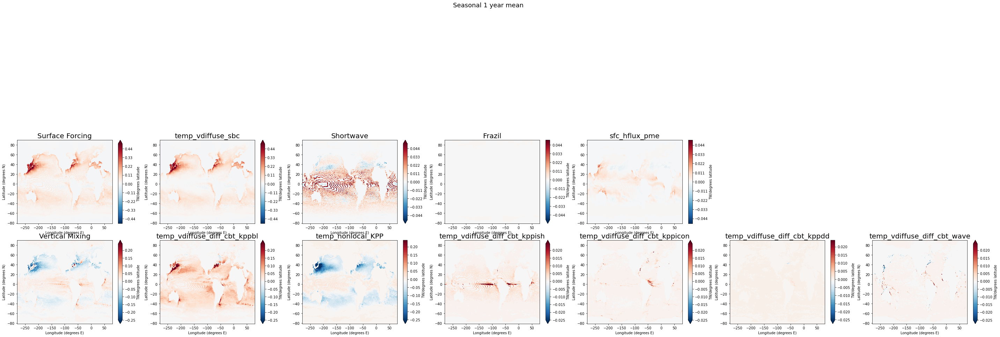

In [26]:
DataSet = Twomo_mean_1year_means - Mean_1year_means

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)/100
MXcbar = np.arange(-25.,25.,1.)/100

cmap = 'RdBu_r'

plot_decomp_map(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar, SFcbar/10, MXcbar/10,'Seasonal 1 year mean')

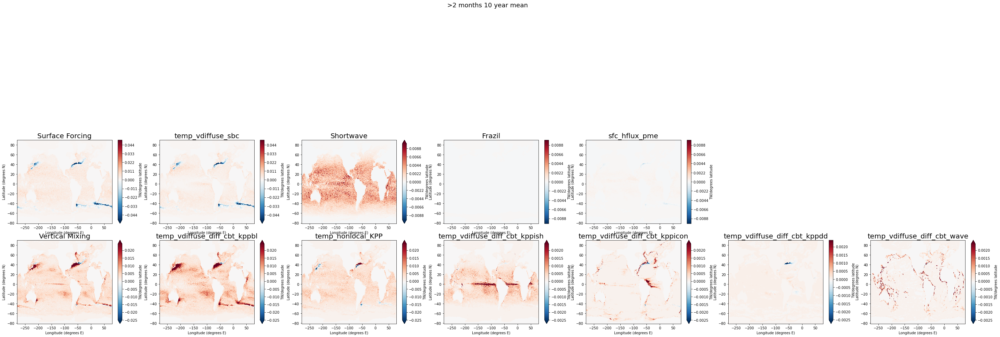

In [12]:
DataSet = Twomo_mean_10year_means - sc_Twomo_mean_10year_means

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)/1000
MXcbar = np.arange(-25.,25.,1.)/1000

cmap = 'RdBu_r'

plot_decomp_map(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar, SFcbar/5, MXcbar/10,'>2 months 10 year mean')

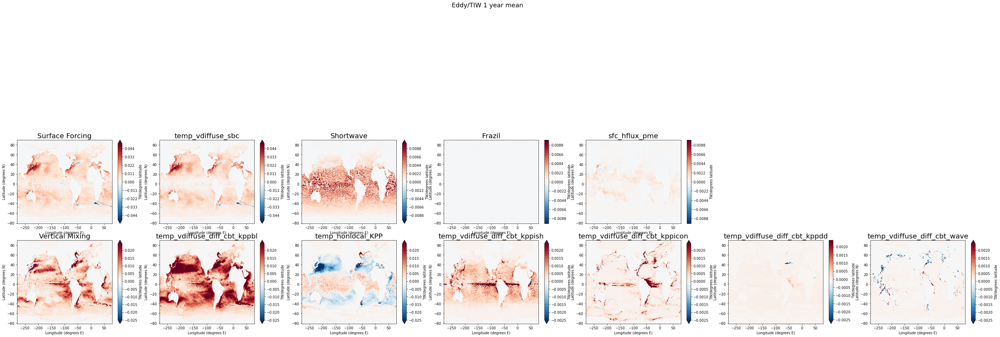

In [23]:
DataSet = Tenday_mean_1year_means - Twomo_mean_1year_means 

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)/1000
MXcbar = np.arange(-25.,25.,1.)/1000

cmap = 'RdBu_r'

plot_decomp_map(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar, SFcbar/5, MXcbar/10,'Eddy/TIW 1 year mean')

2022-05-05 17:11:13,202 - distributed.worker_memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker.html#memtrim for more information. -- Unmanaged memory: 21.98 GiB -- Worker memory limit: 31.25 GiB
2022-05-05 17:11:13,253 - distributed.worker_memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker.html#memtrim for more information. -- Unmanaged memory: 21.98 GiB -- Worker memory limit: 31.25 GiB


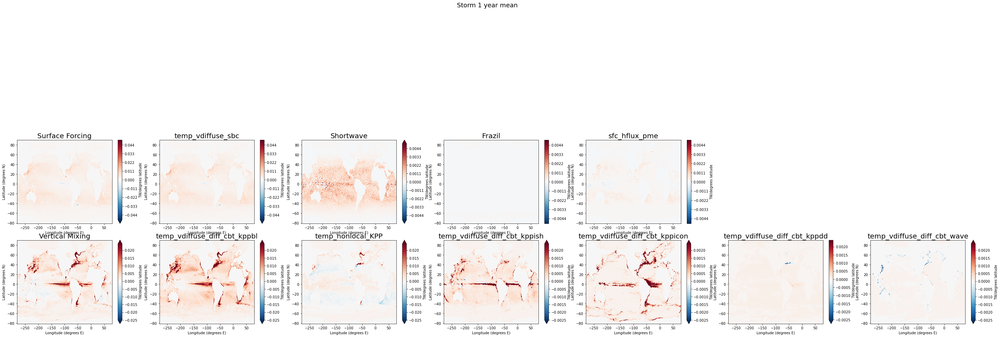

In [28]:
DataSet = Oneday_mean_1year_means  - Tenday_mean_1year_means 

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)/1000
MXcbar = np.arange(-25.,25.,1.)/1000

cmap = 'RdBu_r'

plot_decomp_map(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar, SFcbar/10, MXcbar/10,'Storm 1 year mean')

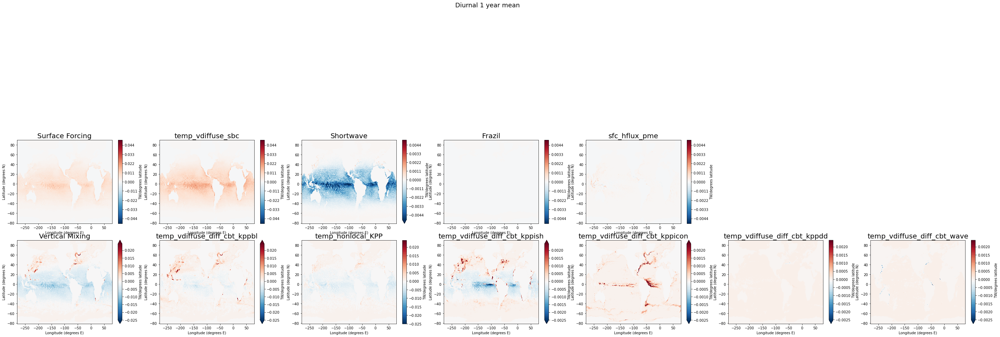

In [14]:
DataSet = True_1year_means - Oneday_mean_1year_means 

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)/1000
MXcbar = np.arange(-25.,25.,1.)/1000

cmap = 'RdBu_r'

plot_decomp_map(DataSet, Psicbar, Hfcbar, SFcbar, MXcbar, SFcbar/10, MXcbar/10,'Diurnal 1 year mean')

# Nice Plots for Paper

In [9]:
Psi = True_10year_means.Psi
Psi_mean_tot = Mean_10year_means.Psi
Psi_ac = (sc_Twomo_mean_10year_means - Mean_10year_means).Psi
Psi_lt = (Twomo_mean_10year_means - sc_Twomo_mean_10year_means).Psi

Psi_TIWs = (Tenday_mean_1year_means - Twomo_mean_1year_means).Psi
Psi_storm = (Oneday_mean_1year_means- Tenday_mean_1year_means).Psi
Psi_diurnal = (True_1year_means-Oneday_mean_1year_means).Psi

In [10]:
SF = True_10year_means.SF
SF_mean_tot = Mean_10year_means.SF
SF_ac = (sc_Twomo_mean_10year_means - Mean_10year_means).SF
SF_lt = (Twomo_mean_10year_means - sc_Twomo_mean_10year_means).SF
SF_TIWs = (Tenday_mean_1year_means - Twomo_mean_1year_means).SF
SF_storm = (Oneday_mean_1year_means- Tenday_mean_1year_means).SF
SF_diurnal = (True_1year_means-Oneday_mean_1year_means).SF

In [11]:
MX = True_10year_means.MX
MX_mean_tot = Mean_10year_means.MX
MX_ac = (sc_Twomo_mean_10year_means - Mean_10year_means).MX
MX_lt = (Twomo_mean_10year_means - sc_Twomo_mean_10year_means).MX

MX_TIWs = (Tenday_mean_1year_means - Twomo_mean_1year_means).MX
MX_storm = (Oneday_mean_1year_means- Tenday_mean_1year_means).MX
MX_diurnal = (True_1year_means-Oneday_mean_1year_means).MX

In [12]:
Hf = -Cp*rho0*dT*gridwm.cumsum(True_10year_means.Psi,'T',boundary="fill", fill_value=0)
Hf_mean_tot = -Cp*rho0*dT*gridwm.cumsum(Mean_10year_means.Psi,'T',boundary="fill", fill_value=0)
Hf_ac = -Cp*rho0*dT*gridwm.cumsum((sc_Twomo_mean_10year_means - Mean_10year_means).Psi,'T',boundary="fill", fill_value=0)
Hf_lt = -Cp*rho0*dT*gridwm.cumsum((Twomo_mean_10year_means - sc_Twomo_mean_10year_means).Psi,'T',boundary="fill", fill_value=0)

Hf_TIWs = -Cp*rho0*dT*gridwm.cumsum((Tenday_mean_1year_means - Twomo_mean_1year_means).Psi,'T',boundary="fill", fill_value=0)
Hf_storm = -Cp*rho0*dT*gridwm.cumsum((Oneday_mean_1year_means- Tenday_mean_1year_means).Psi,'T',boundary="fill", fill_value=0)
Hf_diurnal = -Cp*rho0*dT*gridwm.cumsum((True_1year_means-Oneday_mean_1year_means).Psi,'T',boundary="fill", fill_value=0)


In [13]:
# masking:
maskPsi = 0*True_10year_means.Psi.sum('grid_xt_ocean').where(True_10year_means.Psi.sum('grid_xt_ocean')!=True_10year_means.Psi.sum('grid_xt_ocean').isel(neutralrho_edges=-1))+1.
maskHf = gridwm.interp(maskPsi,'T')
maskSF = gridwm.interp(maskPsi,'y',boundary="fill",fill_value=0.)
maskSF


<xarray.DataArray 'mul-069b237702e54a17a5ce4dfa9b0d1784' (neutralrho_edges: 75,
                                                          grid_yt_ocean: 1080)>
dask.array<mul, shape=(75, 1080), dtype=float64, chunksize=(75, 107), chunktype=numpy.ndarray>
Coordinates:
  * neutralrho_edges  (neutralrho_edges) float64 -3.0 -2.5 -2.0 ... 33.5 34.0
  * grid_yt_ocean     (grid_yt_ocean) float64 -81.08 -80.97 ... 89.84 89.95

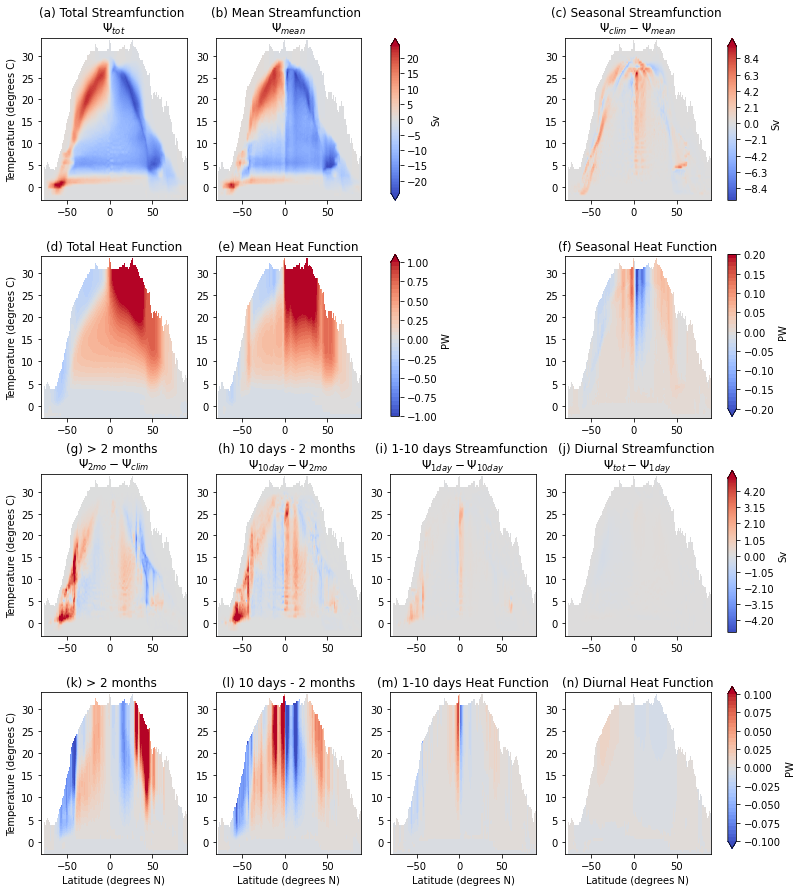

In [22]:
# Plotting:
fig = plt.figure(figsize=(12,15),facecolor='w')

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-25.,25.,1.)

cmap = 'coolwarm'

# Saturated bars for the seasonal/eddy terms:
sat = True
if (sat):
    Psicbar_sc = np.arange(-10.,10.1,0.1)
    Hfcbar_sc = np.arange(-0.2,0.21,0.01)
    SFcbar_sc = np.arange(-50.,51.,1.)
    MXcbar_sc = np.arange(-25.,25.,1.)
    Psicbar_e = np.arange(-5.,5.1,0.05)
    Hfcbar_e = np.arange(-0.1,0.105,0.005)
    SFcbar_e = np.arange(-5.,5.1,0.1)
    MXcbar_e = np.arange(-2.5,2.51,0.1)
else:
    Psicbar_sc = Psicbar
    Hfcbar_sc = Hfcbar
    SFcbar_sc = SFcbar
    MXcbar_sc = MXcbar
    Psicbar_e = Psicbar
    Hfcbar_e = Hfcbar
    SFcbar_e = SFcbar
    MXcbar_e = MXcbar

plt.subplot(4,4,1)
(Psi.sum('grid_xt_ocean').where(maskPsi==1.)/1.e6).plot.contourf(levels=Psicbar,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(a) Total Streamfunction \n$\Psi_{tot}$')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('')

plt.subplot(4,4,2)
cb_SFrow1mean = (Psi_mean_tot.sum('grid_xt_ocean').where(maskPsi==1.)/1.e6).plot.contourf(levels=Psicbar,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(b) Mean Streamfunction \n$\Psi_{mean}$')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,4)
cb_SFrow1 = (Psi_ac.sum('grid_xt_ocean').where(maskPsi==1.)/1.e6).plot.contourf(levels=Psicbar_sc,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(c) Seasonal Streamfunction \n$\Psi_{clim}-\Psi_{mean}$')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,9)
cb_SFrow2 = (Psi_lt.sum('grid_xt_ocean').where(maskPsi==1.)/1.e6).plot.contourf(levels=Psicbar_e,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(g) > 2 months \n$\Psi_{2mo}-\Psi_{clim}$')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('')

plt.subplot(4,4,10)
cb_SFrow2 =(Psi_TIWs.sum('grid_xt_ocean').where(maskPsi==1.)/1.e6).plot.contourf(levels=Psicbar_e,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(h) 10 days - 2 months \n$\Psi_{10day}-\Psi_{2mo}$')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,11)
(Psi_storm.sum('grid_xt_ocean').where(maskPsi==1.)/1.e6).plot.contourf(levels=Psicbar_e,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(i) 1-10 days Streamfunction \n$\Psi_{1day}-\Psi_{10day}$')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,12)
(Psi_diurnal.sum('grid_xt_ocean').where(maskPsi==1.)/1.e6).plot.contourf(levels=Psicbar_e,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(j) Diurnal Streamfunction \n$\Psi_{tot}-\Psi_{1day}$')
plt.ylabel('')
plt.xlabel('')


plt.subplot(4,4,5)
(Hf.sum('grid_xt_ocean').where(maskHf==1.)/1.e15).plot.contourf(levels=Hfcbar,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(d) Total Heat Function')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('')

plt.subplot(4,4,6)
cb_Hfrow1mean = (Hf_mean_tot.sum('grid_xt_ocean').where(maskHf==1.)/1.e15).plot.contourf(levels=Hfcbar,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(e) Mean Heat Function')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,8)
cb_Hfrow1 = (Hf_ac.sum('grid_xt_ocean').where(maskHf==1.)/1.e15).plot.contourf(levels=Hfcbar_sc,x='grid_yu_ocean',add_colorbar = False,cmap=cmap)
plt.title('(f) Seasonal Heat Function')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,13)
cb_Hfrow2 = (Hf_lt.sum('grid_xt_ocean').where(maskHf==1.)/1.e15).plot.contourf(levels=Hfcbar_e,x='grid_yu_ocean',cmap=cmap, add_colorbar = False)
plt.title('(k) > 2 months ')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('Latitude (degrees N)')

plt.subplot(4,4,14)
cb_Hfrow2 =(Hf_TIWs.sum('grid_xt_ocean').where(maskHf==1.)/1.e15).plot.contourf(levels=Hfcbar_e,x='grid_yu_ocean',cmap=cmap, add_colorbar = False)
plt.title('(l) 10 days - 2 months')
plt.ylabel('')
plt.xlabel('Latitude (degrees N)')

plt.subplot(4,4,15)
(Hf_storm.sum('grid_xt_ocean').where(maskHf==1.)/1.e15).plot.contourf(levels=Hfcbar_e,x='grid_yu_ocean',cmap=cmap, add_colorbar = False)
plt.title('(m) 1-10 days Heat Function')
plt.ylabel('')
plt.xlabel('Latitude (degrees N)')

plt.subplot(4,4,16)
(Hf_diurnal.sum('grid_xt_ocean').where(maskHf==1.)/1.e15).plot.contourf(levels=Hfcbar_e,x='grid_yu_ocean',cmap=cmap, add_colorbar = False)
plt.title('(n) Diurnal Heat Function')
plt.ylabel('')
plt.xlabel('Latitude (degrees N)')

fig.subplots_adjust(wspace = 0.2, hspace = 0.35, right = 0.9)

ax_cb = plt.axes([0.53,0.73,0.01,0.15])
plt.colorbar(cb_SFrow1mean, cax = ax_cb, label = 'Sv')


ax_cb = plt.axes([0.53,0.53,0.01,0.15])
plt.colorbar(cb_Hfrow1mean, cax = ax_cb, label = 'PW')


ax_cb = plt.axes([0.92,0.73,0.01,0.15])
plt.colorbar(cb_SFrow1, cax = ax_cb, label = 'Sv')


ax_cb = plt.axes([0.92,0.53,0.01,0.15])
plt.colorbar(cb_Hfrow1, cax = ax_cb, label = 'PW')


ax_cb = plt.axes([0.92,0.33,0.01,0.15])
plt.colorbar(cb_SFrow2, cax = ax_cb, label = 'Sv')


ax_cb = plt.axes([0.92,0.13,0.01,0.15])
plt.colorbar(cb_Hfrow2, cax = ax_cb, label = 'PW')


#plt.tight_layout()
plt.savefig('Decomposition_stream_and_heat_func_sat.png',dpi = 200)

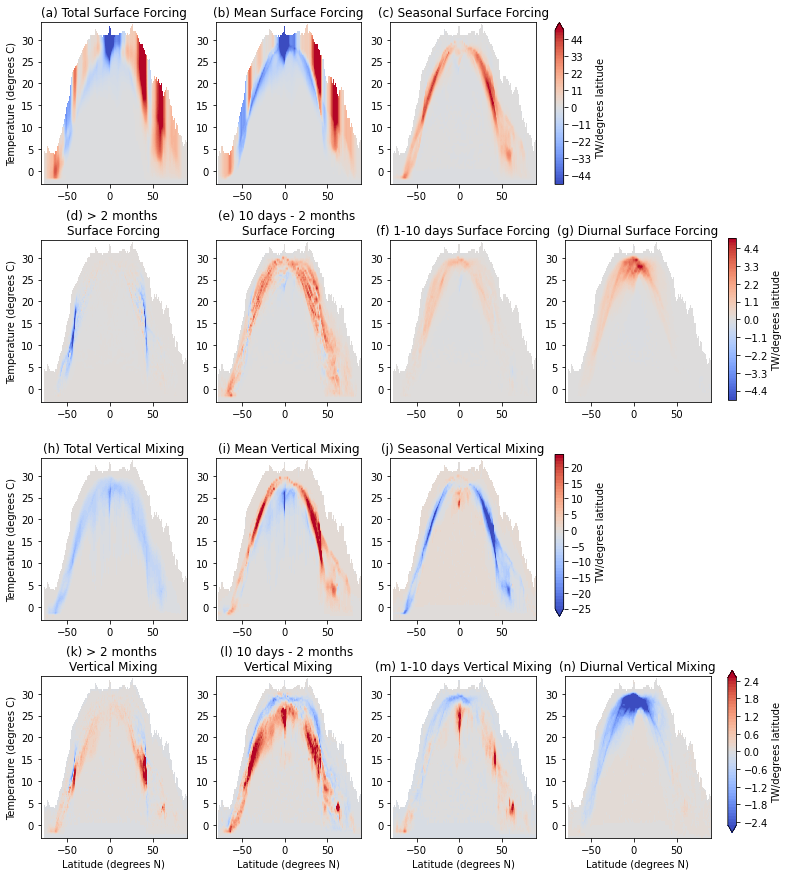

2022-06-02 12:30:52,141 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:52,500 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:52,516 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:52,848 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:52,856 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:52,966 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:53,096 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:53,196 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:53,555 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:53,558 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:53,647 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:53,747 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:53,754 - distributed.nanny - WARNING - Restarting worker
2022-06-02 12:30:53,931 - distributed.

In [23]:
# Plotting:
fig = plt.figure(figsize=(12,15),facecolor='w')

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-25.,25.,1.)

cmap = 'coolwarm'

# Saturated bars for the seasonal/eddy terms:
sat = True
if (sat):
    Psicbar_sc = np.arange(-10.,10.1,0.1)
    Hfcbar_sc = np.arange(-0.2,0.21,0.01)
    SFcbar_sc = np.arange(-50.,51.,1.)
    MXcbar_sc = np.arange(-25.,25.,1.)
    Psicbar_e = np.arange(-5.,5.1,0.05)
    Hfcbar_e = np.arange(-0.1,0.105,0.005)
    SFcbar_e = np.arange(-5.,5.1,0.1)
    MXcbar_e = np.arange(-2.5,2.51,0.1)
else:
    Psicbar_sc = Psicbar
    Hfcbar_sc = Hfcbar
    SFcbar_sc = SFcbar
    MXcbar_sc = MXcbar
    Psicbar_e = Psicbar
    Hfcbar_e = Hfcbar
    SFcbar_e = SFcbar
    MXcbar_e = MXcbar

plt.subplot(4,4,1)
(SF.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(a) Total Surface Forcing')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('')

plt.subplot(4,4,2)
cb_SFrow1mean = (SF_mean_tot.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(b) Mean Surface Forcing')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,3)
cb_SFrow1 = (SF_ac.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(c) Seasonal Surface Forcing')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,5)
cb_SFrow2 = (SF_lt.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar_e,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(d) > 2 months \nSurface Forcing')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('')

plt.subplot(4,4,6)
cb_SFrow2 =(SF_TIWs.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar_e,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(e) 10 days - 2 months \nSurface Forcing')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,7)
(SF_storm.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar_e,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(f) 1-10 days Surface Forcing')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,8)
(SF_diurnal.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=SFcbar_e,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(g) Diurnal Surface Forcing')
plt.ylabel('')
plt.xlabel('')


plt.subplot(4,4,9)
(MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(h) Total Vertical Mixing')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('')

plt.subplot(4,4,10)
cb_MXrow1mean = (MX_mean_tot.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(i) Mean Vertical Mixing')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,11)
cb_MXrow1 = (MX_ac.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(j) Seasonal Vertical Mixing')
plt.ylabel('')
plt.xlabel('')

plt.subplot(4,4,13)
cb_MXrow2 = (MX_lt.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar_e,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(k) > 2 months \nVertical Mixing')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('Latitude (degrees N)')

plt.subplot(4,4,14)
cb_MXrow2 =(MX_TIWs.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar_e,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(l) 10 days - 2 months \nVertical Mixing')
plt.ylabel('')
plt.xlabel('Latitude (degrees N)')

plt.subplot(4,4,15)
(MX_storm.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar_e,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(m) 1-10 days Vertical Mixing')
plt.ylabel('')
plt.xlabel('Latitude (degrees N)')

plt.subplot(4,4,16)
(MX_diurnal.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar_e,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(n) Diurnal Vertical Mixing')
plt.ylabel('')
plt.xlabel('Latitude (degrees N)')

fig.subplots_adjust(wspace = 0.2, hspace = 0.35, right = 0.9)

ax_cb = plt.axes([0.72,0.73,0.01,0.15])
plt.colorbar(cb_SFrow1, cax = ax_cb, label = 'TW/degrees latitude')

ax_cb = plt.axes([0.92,0.53,0.01,0.15])
plt.colorbar(cb_SFrow2, cax = ax_cb, label = 'TW/degrees latitude')

ax_cb = plt.axes([0.72,0.33,0.01,0.15])
plt.colorbar(cb_MXrow1, cax = ax_cb, label = 'TW/degrees latitude')

ax_cb = plt.axes([0.92,0.13,0.01,0.15])
plt.colorbar(cb_MXrow2, cax = ax_cb, label = 'TW/degrees latitude')


#plt.tight_layout()
plt.savefig('Decomposition_SF_mixing_sat.png',dpi = 200)

In [38]:
cmdict = cm.tools.get_dict(cm.cm.thermal, N=9)

#color = (cmdict['red'][j+4][1],cmdict['green'][j+4][1],cmdict['blue'][j][1])

In [14]:
c0 = 'k'#(cmdict['red'][8][1],cmdict['green'][8][1],cmdict['blue'][8][1])#'k'
c1 = 'C0'#(cmdict['red'][7][1],cmdict['green'][7][1],cmdict['blue'][7][1])#'blue'
c2 = 'C1'#(cmdict['red'][6][1],cmdict['green'][6][1],cmdict['blue'][6][1])#'royalblue'
c3 = 'navy'#(cmdict['red'][5][1],cmdict['green'][5][1],cmdict['blue'][5][1])#'darkviolet'
c4 = 'C2'#(cmdict['red'][4][1],cmdict['green'][4][1],cmdict['blue'][4][1])#'palevioletred'
c5 = 'C4'#(cmdict['red'][3][1],cmdict['green'][3][1],cmdict['blue'][3][1])#'salmon'
c6 = 'C5'#(cmdict['red'][2][1],cmdict['green'][2][1],cmdict['blue'][2][1])#'orange'

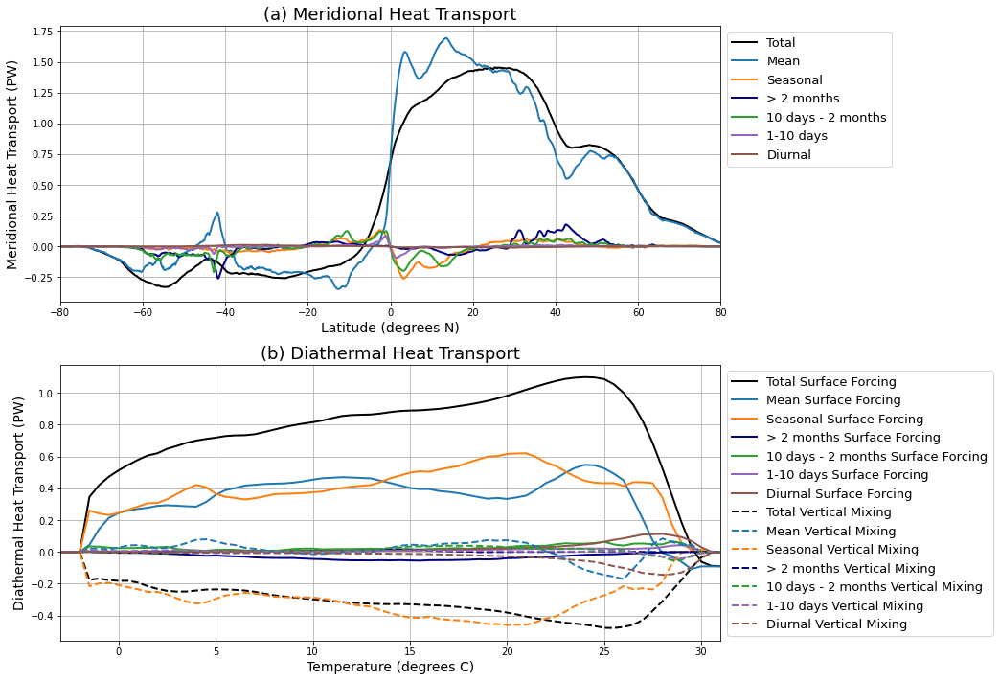

In [15]:
# Totals in temperature and meridional directions:
plt.figure(figsize=(14,10))

plt.subplot(2,1,1)
(Hf.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c0,label='Total',linewidth=2)
(Hf_mean_tot.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c1,label='Mean',linewidth=2)
(Hf_ac.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c2,label='Seasonal',linewidth=2)
(Hf_lt.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c3,label='> 2 months',linewidth=2)
(Hf_TIWs.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c4,label='10 days - 2 months',linewidth=2)
(Hf_storm.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c5,label='1-10 days',linewidth=2)
(Hf_diurnal.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c6,label='Diurnal',linewidth=2)

plt.legend(bbox_to_anchor = (1,1),loc='upper left', fontsize = 13)
plt.ylabel('Meridional Heat Transport (PW)', fontsize = 14)
plt.xlabel('Latitude (degrees N)', fontsize = 14)
plt.title('(a) Meridional Heat Transport', fontsize = 18)
plt.grid()
plt.xlim([-80.,80.])

plt.subplot(2,1,2)
(SF.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Total Surface Forcing',color=c0,linewidth=2)
(SF_mean_tot.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Mean Surface Forcing',color=c1,linewidth=2)
(SF_ac.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Seasonal Surface Forcing',color=c2,linewidth=2)
(SF_lt.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='> 2 months Surface Forcing',color=c3,linewidth=2)
(SF_TIWs.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='10 days - 2 months Surface Forcing',color=c4,linewidth=2)
(SF_storm.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='1-10 days Surface Forcing',color=c5,linewidth=2)
(SF_diurnal.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Diurnal Surface Forcing',color=c6,linewidth=2)


(MX.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Total Vertical Mixing',color=c0,linestyle='dashed',linewidth=2)
(MX_mean_tot.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Mean Vertical Mixing',color=c1,linestyle='dashed',linewidth=2)
(MX_ac.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Seasonal Vertical Mixing',color=c2,linestyle='dashed',linewidth=2)
(MX_lt.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='> 2 months Vertical Mixing',color=c3,linestyle='dashed',linewidth=2)
(MX_TIWs.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='10 days - 2 months Vertical Mixing',color=c4,linestyle='dashed',linewidth=2)
(MX_storm.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='1-10 days Vertical Mixing',color=c5,linestyle='dashed',linewidth=2)
(MX_diurnal.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Diurnal Vertical Mixing',color=c6,linestyle='dashed',linewidth=2)

plt.legend(bbox_to_anchor = (1,1),loc='upper left', fontsize = 13)
plt.ylabel('Diathermal Heat Transport (PW)', fontsize = 14)
plt.xlabel('Temperature (degrees C)', fontsize = 14)
plt.title('(b) Diathermal Heat Transport', fontsize = 18)
plt.grid()
plt.xlim([-3.,31.])

plt.tight_layout()
plt.subplots_adjust(right = 0.75)
plt.savefig('MHT_DHT_7timescales.png',dpi = 200)

## Split into 4 panels

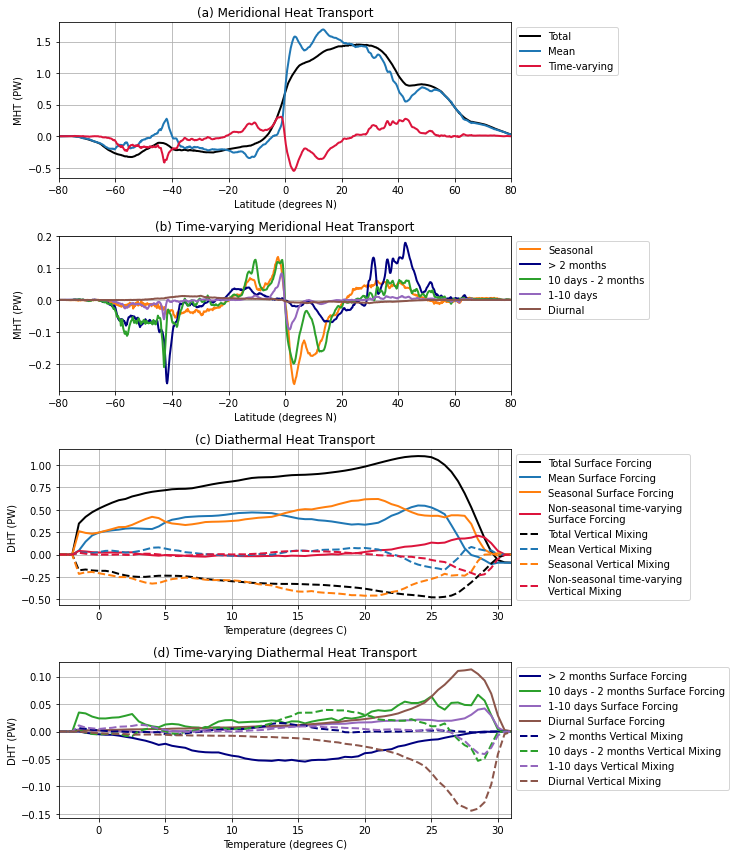

In [28]:
plt.figure(figsize=(11,12))

plt.subplot(4,1,1)
(Hf.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c0,label='Total',linewidth=2)
(Hf_mean_tot.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c1,label='Mean',linewidth=2)
((Hf_ac+Hf_lt+Hf_TIWs+Hf_storm+Hf_diurnal).sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = 'crimson',label='Time-varying',linewidth=2)
#(Hf_lt.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c3,label='> 2 months',linewidth=2)
#(Hf_TIWs.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c4,label='10 days - 2 months',linewidth=2)
#(Hf_storm.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c5,label='1-10 days',linewidth=2)
#(Hf_diurnal.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c6,label='Diurnal',linewidth=2)

plt.legend(bbox_to_anchor = (1,1),loc='upper left')
plt.ylabel('MHT (PW)')
plt.xlabel('Latitude (degrees N)')
plt.title('(a) Meridional Heat Transport')
plt.grid()
plt.xlim([-80.,80.])
 
plt.subplot(4,1,2)
#(Hf.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c0,label='Total',linewidth=2)
#(Hf_mean_tot.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c1,label='Mean',linewidth=2)
(Hf_ac.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c2,label='Seasonal',linewidth=2)
(Hf_lt.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c3,label='> 2 months',linewidth=2)
(Hf_TIWs.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c4,label='10 days - 2 months',linewidth=2)
(Hf_storm.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c5,label='1-10 days',linewidth=2)
(Hf_diurnal.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(color = c6,label='Diurnal',linewidth=2)

plt.legend(bbox_to_anchor = (1,1),loc='upper left')
plt.ylabel('MHT (PW)')
plt.xlabel('Latitude (degrees N)')
plt.title('(b) Time-varying Meridional Heat Transport')
plt.grid()
plt.xlim([-80.,80.])


plt.subplot(4,1,3)
(SF.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Total Surface Forcing',color=c0,linewidth=2)
(SF_mean_tot.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Mean Surface Forcing',color=c1,linewidth=2)
(SF_ac.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Seasonal Surface Forcing',color=c2,linewidth=2)
((SF_lt+SF_TIWs+SF_storm+SF_diurnal).sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Non-seasonal time-varying \nSurface Forcing',color='crimson',linewidth=2)
#(SF_TIWs.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='10 days - 2 months Surface Forcing',color=c4,linewidth=2)
#(SF_storm.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='1-10 days Surface Forcing',color=c5,linewidth=2)
#(SF_diurnal.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Diurnal Surface Forcing',color=c6,linewidth=2)


(MX.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Total Vertical Mixing',color=c0,linestyle='dashed',linewidth=2)
(MX_mean_tot.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Mean Vertical Mixing',color=c1,linestyle='dashed',linewidth=2)
(MX_ac.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Seasonal Vertical Mixing',color=c2,linestyle='dashed',linewidth=2)
((MX_lt+MX_TIWs+MX_storm+MX_diurnal).sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Non-seasonal time-varying \nVertical Mixing',color='crimson',linestyle='dashed',linewidth=2)
#(MX_TIWs.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='10 days - 2 months Vertical Mixing',color=c4,linestyle='dashed',linewidth=2)
#(MX_storm.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='1-10 days Vertical Mixing',color=c5,linestyle='dashed',linewidth=2)
#(MX_diurnal.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Diurnal Vertical Mixing',color=c6,linestyle='dashed',linewidth=2)

plt.legend(bbox_to_anchor = (1,1),loc='upper left')
plt.ylabel('DHT (PW)')
plt.xlabel('Temperature (degrees C)')
plt.title('(c) Diathermal Heat Transport')
plt.grid()
plt.xlim([-3.,31.])

plt.subplot(4,1,4)
# (SF.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Total Surface Forcing',color=c0,linewidth=2)
# (SF_mean_tot.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Mean Surface Forcing',color=c1,linewidth=2)
# (SF_ac.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Seasonal Surface Forcing',color=c2,linewidth=2)
(SF_lt.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='> 2 months Surface Forcing',color=c3,linewidth=2)
(SF_TIWs.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='10 days - 2 months Surface Forcing',color=c4,linewidth=2)
(SF_storm.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='1-10 days Surface Forcing',color=c5,linewidth=2)
(SF_diurnal.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Diurnal Surface Forcing',color=c6,linewidth=2)


# (MX.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Total Vertical Mixing',color=c0,linestyle='dashed',linewidth=2)
# (MX_mean_tot.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Mean Vertical Mixing',color=c1,linestyle='dashed',linewidth=2)
# (MX_ac.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Seasonal Vertical Mixing',color=c2,linestyle='dashed',linewidth=2)
(MX_lt.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='> 2 months Vertical Mixing',color=c3,linestyle='dashed',linewidth=2)
(MX_TIWs.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='10 days - 2 months Vertical Mixing',color=c4,linestyle='dashed',linewidth=2)
(MX_storm.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='1-10 days Vertical Mixing',color=c5,linestyle='dashed',linewidth=2)
(MX_diurnal.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Diurnal Vertical Mixing',color=c6,linestyle='dashed',linewidth=2)

plt.legend(bbox_to_anchor = (1,1),loc='upper left')
plt.ylabel('DHT (PW)')
plt.xlabel('Temperature (degrees C)')
plt.title('(d) Time-varying Diathermal Heat Transport')
plt.grid()
plt.xlim([-3.,31.])


plt.tight_layout()
plt.subplots_adjust(right = 0.65)
plt.savefig('MHT_DHT_7timescales_4panels.png',dpi = 200,pad_inches=3)

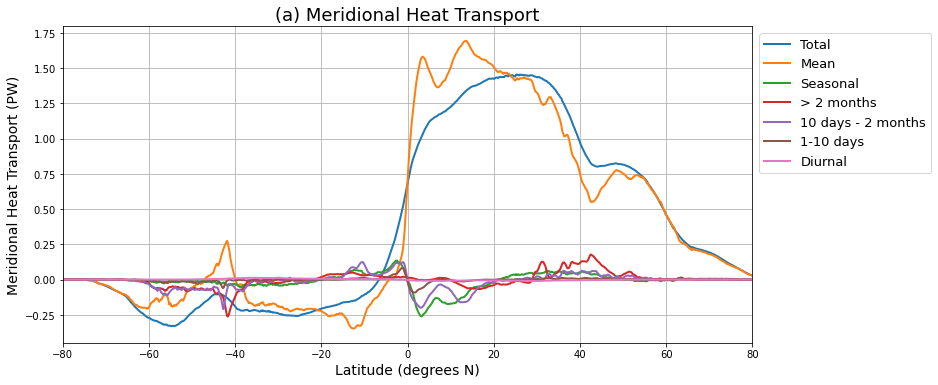

In [10]:
# Totals in temperature and meridional directions:
plt.figure(figsize=(14,10))

plt.subplot(2,1,1)
(Hf.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(label='Total',linewidth=2)
(Hf_mean_tot.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(label='Mean',linewidth=2)
(Hf_ac.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(label='Seasonal',linewidth=2)
(Hf_lt.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(label='> 2 months',linewidth=2)
(Hf_TIWs.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(label='10 days - 2 months',linewidth=2)
(Hf_storm.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(label='1-10 days',linewidth=2)
(Hf_diurnal.sum('grid_xt_ocean')/1.e15).isel(neutral=-1).plot(label='Diurnal',linewidth=2)

plt.legend(bbox_to_anchor = (1,1),loc='upper left', fontsize = 13)
plt.ylabel('Meridional Heat Transport (PW)', fontsize = 14)
plt.xlabel('Latitude (degrees N)', fontsize = 14)
plt.title('(a) Meridional Heat Transport', fontsize = 18)
plt.grid()
plt.xlim([-80.,80.])

# plt.subplot(2,1,2)
# (SF.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Total Surface Forcing',color='C0',linewidth=2)
# (SF_mean_tot.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Mean Surface Forcing',color='C1',linewidth=2)
# (SF_ac.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Seasonal Surface Forcing',color='C2',linewidth=2)
# (SF_lt.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='> 2 months Surface Forcing',color='C3',linewidth=2)
# (SF_TIWs.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='10 days - 2 months Surface Forcing',color='C4',linewidth=2)
# (SF_storm.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='1-10 days Surface Forcing',color='C5',linewidth=2)
# (SF_diurnal.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Diurnal Surface Forcing',color='C6',linewidth=2)


# (MX.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Total Vertical Mixing',color='C0',linestyle='dashed',linewidth=2)
# (MX_mean_tot.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Mean Vertical Mixing',color='C1',linestyle='dashed',linewidth=2)
# (MX_ac.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Seasonal Vertical Mixing',color='C2',linestyle='dashed',linewidth=2)
# (MX_lt.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='> 2 months Vertical Mixing',color='C3',linestyle='dashed',linewidth=2)
# (MX_TIWs.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='10 days - 2 months Vertical Mixing',color='C4',linestyle='dashed',linewidth=2)
# (MX_storm.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='1-10 days Vertical Mixing',color='C5',linestyle='dashed',linewidth=2)
# (MX_diurnal.sum('grid_xt_ocean')/1.e15).sum('grid_yt_ocean').plot(label='Diurnal Vertical Mixing',color='C6',linestyle='dashed',linewidth=2)

# plt.legend(bbox_to_anchor = (1,1),loc='upper left', fontsize = 13)
# plt.ylabel('Diathermal Heat Transport (PW)', fontsize = 14)
# plt.xlabel('Temperature (degrees C)', fontsize = 14)
# plt.title('(b) Diathermal Heat Transport', fontsize = 18)
# plt.grid()
# plt.xlim([-3.,31.])

plt.tight_layout()
plt.subplots_adjust(right = 0.75)
plt.savefig('MHT_7timescales.png',dpi = 300)

## lat-lon maps

In [5]:
# Group mean SF and MX terms:
fwmass_mean["SF_cv"] = fwmass_mean.temp_vdiffuse_sbc_on_nrho + \
                       fwmass_mean.sfc_hflux_pme_on_nrho + \
                       fwmass_mean.frazil_on_nrho + \
                       fwmass_mean.sw_heat_on_nrho #+ \
                       #fwmass_mean.temp_rivermix_on_nrho
fwmass_mean["MX_cv"] = fwmass_mean.temp_vdiffuse_diff_cbt_on_nrho + \
                       fwmass_mean.temp_nonlocal_KPP_on_nrho 

obj, obj2 = xr.broadcast(fheat_mean.sfc_hflux_pme,fheat_mean.temp_vdiffuse_sbc)
sfc_hflux_pme_mean = obj.where(fheat_mean.st_ocean==fheat_mean.st_ocean[0],other=0.)

fheat_mean["SF_cv"] = fheat_mean.temp_vdiffuse_sbc + \
                      sfc_hflux_pme_mean + \
                      fheat_mean.frazil_3d + \
                      fheat_mean.sw_heat # + \
#                      fheat_mean.temp_rivermix
fheat_mean["MX_cv"] = fheat_mean.temp_vdiffuse_diff_cbt + \
                      fheat_mean.temp_nonlocal_KPP


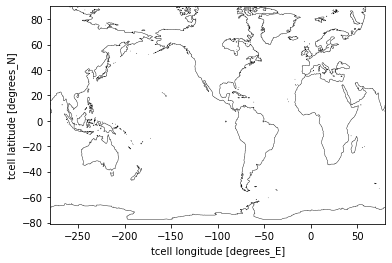

In [6]:
mask = (fgrd.ht.where(fgrd.ht>0)*0+1).fillna(0)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')

In [7]:
dT

array(0.5)

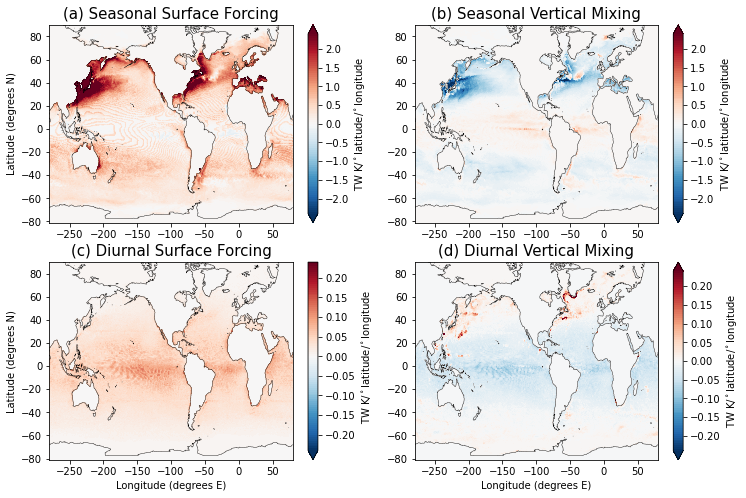

In [20]:
plt.figure(figsize=(12,8),facecolor='w')
cmap = 'RdBu_r'

## Plot data from Seasonal Term
DataSet = sc_Twomo_mean_10year_means - Mean_10year_means

SFcbar = np.arange(-2.4,2.45,0.05)
MXcbar = np.arange(-2.4,2.45,0.05)

plt.subplot(2,2,1)
(DataSet.SF.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=SFcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(a) Seasonal Surface Forcing', fontsize = 15)
plt.ylabel('Latitude (degrees N)')
plt.xlabel('')

plt.subplot(2,2,2)
(DataSet.MX.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(b) Seasonal Vertical Mixing', fontsize = 15)
plt.ylabel('')
plt.xlabel('')

## Plot data from Diurnal Term
DataSet = True_1year_means - Oneday_mean_1year_means 

SFcbar = np.arange(-0.24,0.245,0.005)
MXcbar = np.arange(-0.24,0.245,0.005)

plt.subplot(2,2,3)
(DataSet.SF.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=SFcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(c) Diurnal Surface Forcing', fontsize = 15)
plt.ylabel('Latitude (degrees N)')
plt.xlabel('Longitude (degrees E)')


plt.subplot(2,2,4)
(DataSet.MX.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(d) Diurnal Vertical Mixing', fontsize = 15)
plt.ylabel('')
plt.xlabel('Longitude (degrees E)')


plt.savefig('Maps_seasonal_and_diurnal.png',dpi = 200)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encoun

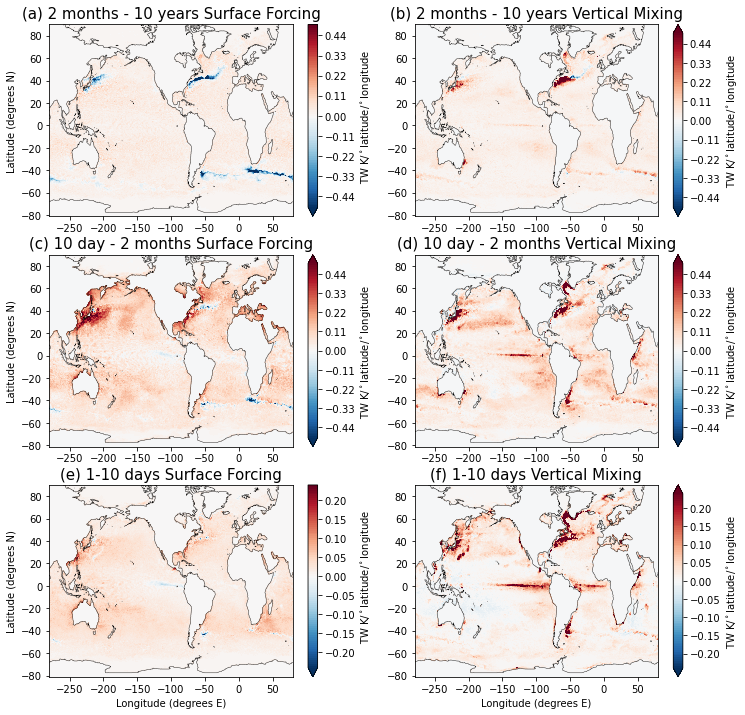

In [16]:
plt.figure(figsize=(12,12),facecolor='w')
cmap = 'RdBu_r'

## Plot data from lt
DataSet = Twomo_mean_10year_means - sc_Twomo_mean_10year_means

SFcbar =  np.arange(-0.5,0.51,0.01)
MXcbar =  np.arange(-0.5,0.51,0.01)

plt.subplot(3,2,1)
(DataSet.SF.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=SFcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(a) 2 months - 10 years Surface Forcing', fontsize = 15)
plt.ylabel('Latitude (degrees N)')
plt.xlabel('')

plt.subplot(3,2,2)
(DataSet.MX.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(b) 2 months - 10 years Vertical Mixing', fontsize = 15)
plt.ylabel('')
plt.xlabel('')

## Plot data from 10day-2 months Term
DataSet = Tenday_mean_1year_means - Twomo_mean_1year_means 

SFcbar =  np.arange(-0.5,0.51,0.01)
MXcbar =  np.arange(-0.5,0.51,0.01)

plt.subplot(3,2,3)
(DataSet.SF.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=SFcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(c) 10 day - 2 months Surface Forcing', fontsize = 15)
plt.ylabel('Latitude (degrees N)')
plt.xlabel('')


plt.subplot(3,2,4)
(DataSet.MX.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(d) 10 day - 2 months Vertical Mixing', fontsize = 15)
plt.ylabel('')
plt.xlabel('')

## Plot data from Storm Term
DataSet = Oneday_mean_1year_means - Tenday_mean_1year_means 

SFcbar = np.arange(-0.24,0.245,0.005)
MXcbar = np.arange(-0.24,0.245,0.005)

plt.subplot(3,2,5)
(DataSet.SF.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=SFcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(e) 1-10 days Surface Forcing', fontsize = 15)
plt.ylabel('Latitude (degrees N)')
plt.xlabel('Longitude (degrees E)')


plt.subplot(3,2,6)
(DataSet.MX.sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(f) 1-10 days Vertical Mixing', fontsize = 15)
plt.ylabel('')
plt.xlabel('Longitude (degrees E)')


plt.savefig('Maps_lt_eddy_storm.png',dpi = 200)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.01/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: invalid value encount

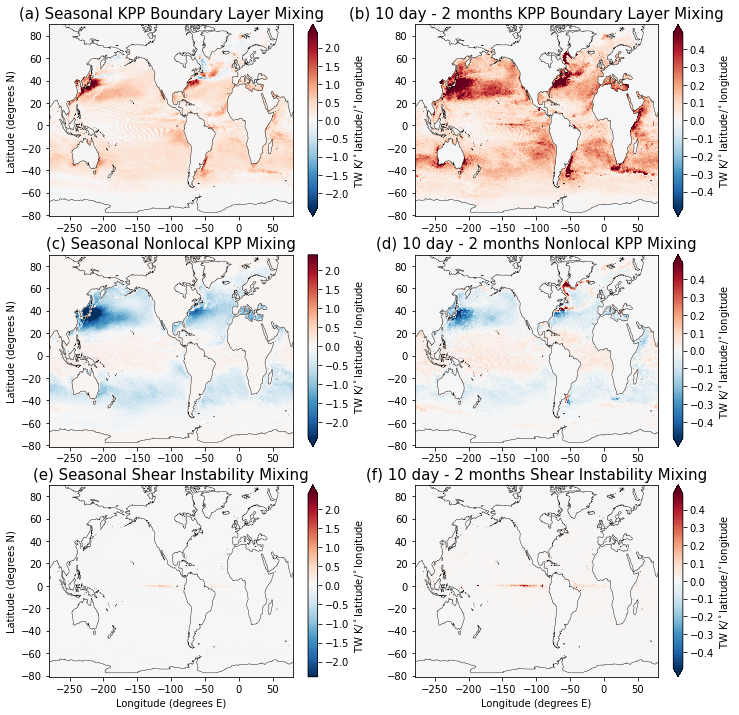

In [7]:
plt.figure(figsize=(12,12),facecolor='w')
cmap = 'RdBu_r'


## Plot data from Seasonal Term
DataSet = sc_Twomo_mean_10year_means - Mean_10year_means

SFcbar = np.arange(-2.4,2.45,0.05)
MXcbar = np.arange(-2.4,2.45,0.05)

plt.subplot(3,2,1)
((DataSet.temp_vdiffuse_diff_cbt_kppbl).sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(a) Seasonal KPP Boundary Layer Mixing', fontsize = 15)
plt.ylabel('Latitude (degrees N)')
plt.xlabel('')

plt.subplot(3,2,3)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish
((temp).sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(c) Seasonal Nonlocal KPP Mixing', fontsize = 15)
plt.ylabel('Latitude (degrees N)')
plt.xlabel('')

plt.subplot(3,2,5)
((DataSet.temp_vdiffuse_diff_cbt_kppish).sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(e) Seasonal Shear Instability Mixing', fontsize = 15)
plt.ylabel('Latitude (degrees N)')
plt.xlabel('Longitude (degrees E)')

## Plot data from 10day-2 months Term
DataSet = Tenday_mean_1year_means - Twomo_mean_1year_means 

SFcbar =  np.arange(-0.49,0.5,0.01)
MXcbar =  np.arange(-0.49,0.5,0.01)

plt.subplot(3,2,2)
((DataSet.temp_vdiffuse_diff_cbt_kppbl).sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(b) 10 day - 2 months KPP Boundary Layer Mixing', fontsize = 15)
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,2,4)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish
((temp).sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(d) 10 day - 2 months Nonlocal KPP Mixing', fontsize = 15)
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,2,6)
((DataSet.temp_vdiffuse_diff_cbt_kppish).sum('neutralrho_edges')/1.e12/dx/dy*dT).plot.contourf(levels=MXcbar,y='grid_yt_ocean',cbar_kwargs={'label':'TW K/$^\circ$latitude/$^\circ$longitude'},cmap=cmap)
mask.plot.contour(levels = [0.5],linewidths = 0.4, colors = 'k')
plt.title('(f) 10 day - 2 months Shear Instability Mixing', fontsize = 15)
plt.ylabel('')
plt.xlabel('Longitude (degrees E)')


plt.savefig('Decomp_mixing.png',dpi = 200)

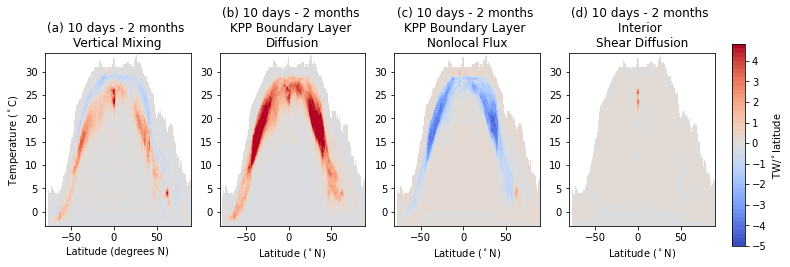

In [14]:
# masking:
maskPsi = 0*True_10year_means.Psi.sum('grid_xt_ocean').where(True_10year_means.Psi.sum('grid_xt_ocean')!=True_10year_means.Psi.sum('grid_xt_ocean').isel(neutralrho_edges=-1))+1.
maskHf = gridwm.interp(maskPsi,'T')
maskSF = gridwm.interp(maskPsi,'y',boundary="fill",fill_value=0.)
maskSF

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-25.,25.,1.)/5

plt.figure(figsize=(12,4),facecolor='w')
cmap = 'coolwarm'

plt.subplot(1,4,1)
DataSet = Tenday_mean_1year_means - Twomo_mean_1year_means 
cbar1  = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(a) 10 days - 2 months \nVertical Mixing')
plt.ylabel('Temperature ($^\circ$C)')
plt.xlabel('Latitude (degrees N)')

plt.subplot(1,4,2)
(DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(b) 10 days - 2 months \nKPP Boundary Layer \nDiffusion')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(1,4,3)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish

(temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(c) 10 days - 2 months \nKPP Boundary Layer \nNonlocal Flux')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(1,4,4)
cbar1 = (DataSet.temp_vdiffuse_diff_cbt_kppish.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(d) 10 days - 2 months \nKPP Interior \nShear Diffusion')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplots_adjust(wspace = 0.2, hspace = 0.35, right = 0.9, bottom = 0.2, top = 0.8 )

ax_cb = plt.axes([0.92,0.13,0.015,0.7])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

plt.savefig('Decompose_10d_2mo_mixing_types.png',dpi = 200)

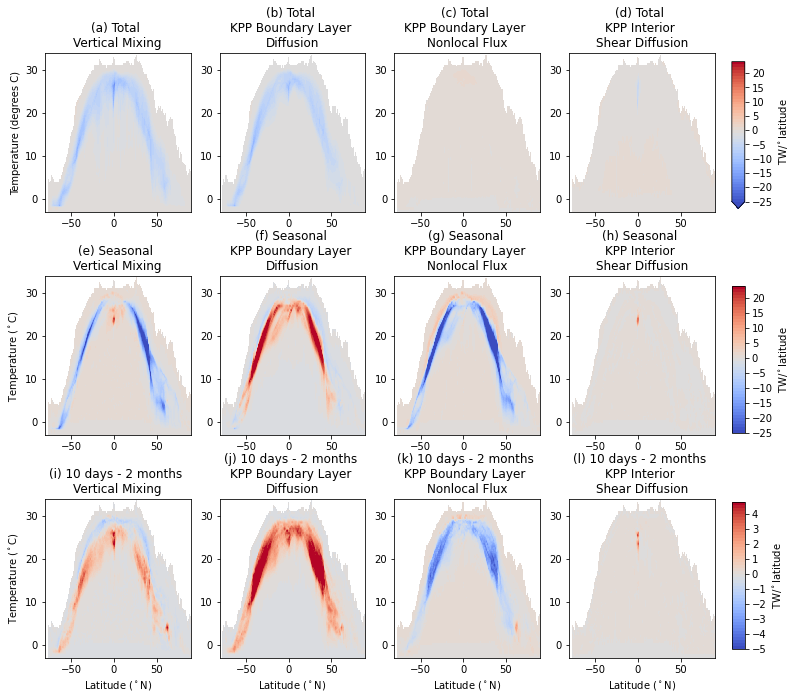

2022-06-07 11:39:42,446 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:42,465 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:42,549 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:42,676 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:42,679 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:42,719 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:42,757 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:42,853 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:43,445 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:43,447 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:43,477 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:43,510 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:43,547 - distributed.nanny - WARNING - Restarting worker
2022-06-07 11:39:43,588 - distributed.

In [9]:
# masking:
maskPsi = 0*True_10year_means.Psi.sum('grid_xt_ocean').where(True_10year_means.Psi.sum('grid_xt_ocean')!=True_10year_means.Psi.sum('grid_xt_ocean').isel(neutralrho_edges=-1))+1.
maskHf = gridwm.interp(maskPsi,'T')
maskSF = gridwm.interp(maskPsi,'y',boundary="fill",fill_value=0.)
maskSF

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-25.,25.,1.)


plt.figure(figsize=(12,12),facecolor='w')
cmap = 'coolwarm'
    
DataSet = True_1year_means

plt.subplot(3,4,1)
cbar1 = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(a) Total \nVertical Mixing')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('')

plt.subplot(3,4,2)
(DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(b) Total \nKPP Boundary Layer \nDiffusion')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,3)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish
(temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(c) Total \nKPP Boundary Layer \nNonlocal Flux')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,4)
(DataSet.temp_vdiffuse_diff_cbt_kppish.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(d) Total \nKPP Interior \nShear Diffusion')
plt.ylabel('')
plt.xlabel('')

ax_cb = plt.axes([0.92,0.62,0.015,0.17])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')


plt.subplot(3,4,5)
DataSet =  sc_Twomo_mean_10year_means - Mean_10year_means
MXcbar = np.arange(-25.,25.,1.)
cbar1  = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(e) Seasonal \nVertical Mixing')
plt.ylabel('Temperature ($^\circ$C)')
plt.xlabel('')

plt.subplot(3,4,6)
(DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(f) Seasonal \nKPP Boundary Layer \nDiffusion')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,7)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish

(temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(g) Seasonal \nKPP Boundary Layer \nNonlocal Flux')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,8)
cbar1 = (DataSet.temp_vdiffuse_diff_cbt_kppish.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(h) Seasonal \nKPP Interior \nShear Diffusion')
plt.ylabel('')
plt.xlabel('')

ax_cb = plt.axes([0.92,0.36,0.015,0.17])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

MXcbar = np.arange(-25.,25.,1.)/5


plt.subplot(3,4,9)
DataSet = Tenday_mean_1year_means - Twomo_mean_1year_means 
cbar1  = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(i) 10 days - 2 months \nVertical Mixing')
plt.ylabel('Temperature ($^\circ$C)')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(3,4,10)
(DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(j) 10 days - 2 months \nKPP Boundary Layer \nDiffusion')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(3,4,11)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish

(temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(k) 10 days - 2 months \nKPP Boundary Layer \nNonlocal Flux')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(3,4,12)
cbar1 = (DataSet.temp_vdiffuse_diff_cbt_kppish.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(l) 10 days - 2 months \nKPP Interior \nShear Diffusion')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')


ax_cb = plt.axes([0.92,0.11,0.015,0.17])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

plt.subplots_adjust(wspace = 0.2, hspace = 0.4, right = 0.9, bottom = 0.1, top = 0.8 )

plt.savefig('Decompose_10d_2mo_tot_seasonal_mixing_types.png',dpi = 200)

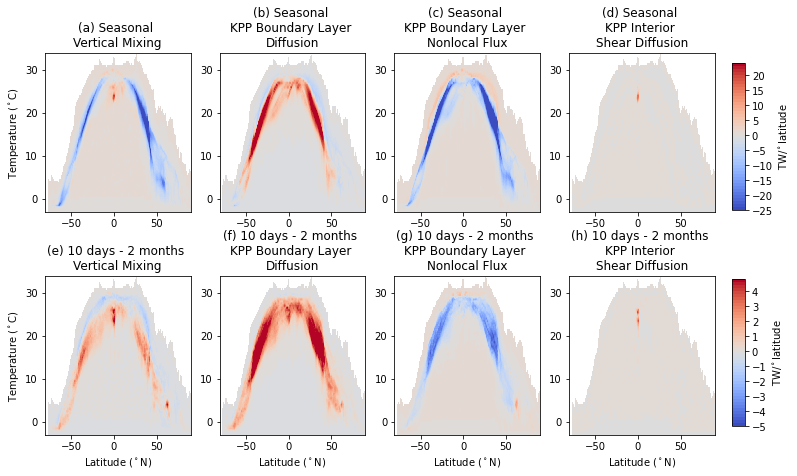

In [30]:
# masking:
maskPsi = 0*True_10year_means.Psi.sum('grid_xt_ocean').where(True_10year_means.Psi.sum('grid_xt_ocean')!=True_10year_means.Psi.sum('grid_xt_ocean').isel(neutralrho_edges=-1))+1.
maskHf = gridwm.interp(maskPsi,'T')
maskSF = gridwm.interp(maskPsi,'y',boundary="fill",fill_value=0.)
maskSF

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-25.,25.,1.)


plt.figure(figsize=(12,12),facecolor='w')
cmap = 'coolwarm'
    
# DataSet = True_1year_means

# plt.subplot(3,4,1)
# cbar1 = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
# plt.title('(a) Total \nVertical Mixing')
# plt.ylabel('Temperature (degrees C)')
# plt.xlabel('')

# plt.subplot(3,4,2)
# (DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
# plt.title('(b) Total \nKPP Boundary Layer \nDiffusion')
# plt.ylabel('')
# plt.xlabel('')

# plt.subplot(3,4,3)
# temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
#        DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
#        DataSet.temp_vdiffuse_diff_cbt_kppish
# (temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
# plt.title('(c) Total \nKPP Boundary Layer \nNonlocal Flux')
# plt.ylabel('')
# plt.xlabel('')

# plt.subplot(3,4,4)
# (DataSet.temp_vdiffuse_diff_cbt_kppish.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
# plt.title('(d) Total \nKPP Interior \nShear Diffusion')
# plt.ylabel('')
# plt.xlabel('')

# ax_cb = plt.axes([0.92,0.62,0.015,0.17])
# plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')


plt.subplot(3,4,5)
DataSet =  sc_Twomo_mean_10year_means - Mean_10year_means
MXcbar = np.arange(-25.,25.,1.)
cbar1  = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(a) Seasonal \nVertical Mixing')
plt.ylabel('Temperature ($^\circ$C)')
plt.xlabel('')

plt.subplot(3,4,6)
(DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(b) Seasonal \nKPP Boundary Layer \nDiffusion')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,7)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish

(temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(c) Seasonal \nKPP Boundary Layer \nNonlocal Flux')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,8)
cbar1 = (DataSet.temp_vdiffuse_diff_cbt_kppish.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(d) Seasonal \nKPP Interior \nShear Diffusion')
plt.ylabel('')
plt.xlabel('')

ax_cb = plt.axes([0.92,0.36,0.015,0.17])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

MXcbar = np.arange(-25.,25.,1.)/5


plt.subplot(3,4,9)
DataSet = Tenday_mean_1year_means - Twomo_mean_1year_means 
cbar1  = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(e) 10 days - 2 months \nVertical Mixing')
plt.ylabel('Temperature ($^\circ$C)')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(3,4,10)
(DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(f) 10 days - 2 months \nKPP Boundary Layer \nDiffusion')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(3,4,11)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish

(temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(g) 10 days - 2 months \nKPP Boundary Layer \nNonlocal Flux')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(3,4,12)
cbar1 = (DataSet.temp_vdiffuse_diff_cbt_kppish.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(h) 10 days - 2 months \nKPP Interior \nShear Diffusion')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')


ax_cb = plt.axes([0.92,0.11,0.015,0.17])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

plt.subplots_adjust(wspace = 0.2, hspace = 0.4, right = 0.9, bottom = 0.1, top = 0.8 )

plt.savefig('Decompose_10d_2mo_seasonal_mixing_types.png',dpi = 200)

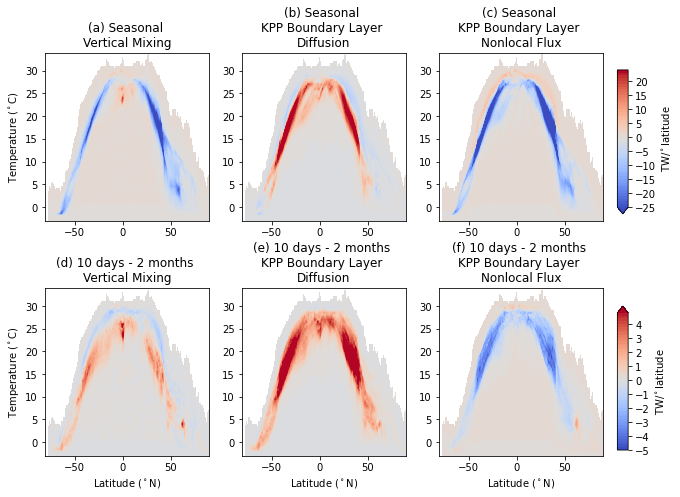

In [26]:
# masking:
maskPsi = 0*True_10year_means.Psi.sum('grid_xt_ocean').where(True_10year_means.Psi.sum('grid_xt_ocean')!=True_10year_means.Psi.sum('grid_xt_ocean').isel(neutralrho_edges=-1))+1.
maskHf = gridwm.interp(maskPsi,'T')
maskSF = gridwm.interp(maskPsi,'y',boundary="fill",fill_value=0.)
maskSF

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-25.,25.,1.)


plt.figure(figsize=(10,8),facecolor='w')
cmap = 'coolwarm'
    
plt.subplot(2,3,1)
DataSet =  sc_Twomo_mean_10year_means - Mean_10year_means
MXcbar = np.arange(-25.,25.,1.)
cbar1  = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(a) Seasonal \nVertical Mixing')
plt.ylabel('Temperature ($^\circ$C)')
plt.xlabel('')

plt.subplot(2,3,2)
(DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(b) Seasonal \nKPP Boundary Layer \nDiffusion')
plt.ylabel('')
plt.xlabel('')

plt.subplot(2,3,3)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish

(temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(c) Seasonal \nKPP Boundary Layer \nNonlocal Flux')
plt.ylabel('')
plt.xlabel('')

ax_cb = plt.axes([0.92,0.52,0.015,0.25])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

MXcbar = np.arange(-25.,25.,1.)/5

plt.subplot(2,3,4)
DataSet = Tenday_mean_1year_means - Twomo_mean_1year_means 
cbar1  = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(d) 10 days - 2 months \nVertical Mixing')
plt.ylabel('Temperature ($^\circ$C)')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(2,3,5)
(DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(e) 10 days - 2 months \nKPP Boundary Layer \nDiffusion')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(2,3,6)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish

(temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(f) 10 days - 2 months \nKPP Boundary Layer \nNonlocal Flux')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

ax_cb = plt.axes([0.92,0.11,0.015,0.25])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

plt.subplots_adjust(wspace = 0.2, hspace = 0.4, right = 0.9, bottom = 0.1, top = 0.8 )

plt.savefig('Decompose_10d_2mo_seasonal_mixing_types.png',dpi = 200)

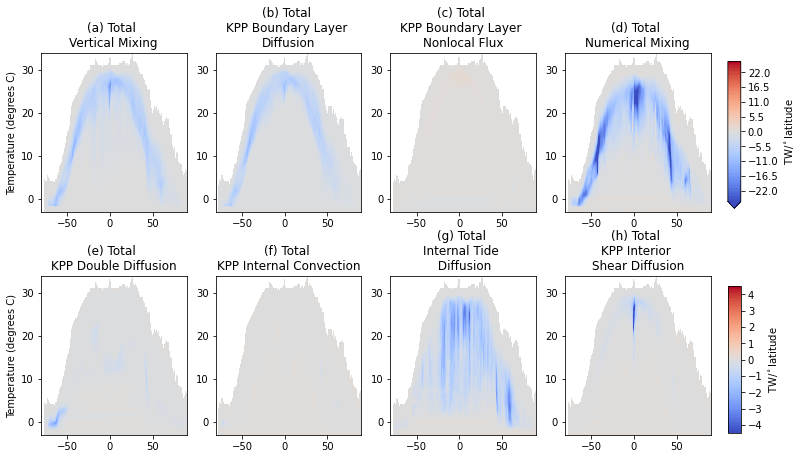

In [7]:
# masking:
maskPsi = 0*True_10year_means.Psi.sum('grid_xt_ocean').where(True_10year_means.Psi.sum('grid_xt_ocean')!=True_10year_means.Psi.sum('grid_xt_ocean').isel(neutralrho_edges=-1))+1.
maskHf = gridwm.interp(maskPsi,'T')
maskSF = gridwm.interp(maskPsi,'y',boundary="fill",fill_value=0.)
maskSF

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-26.,26.5,0.5)


plt.figure(figsize=(12,12),facecolor='w')
cmap = 'coolwarm'
    
DataSet = True_1year_means

plt.subplot(3,4,1)
cbar1 = (DataSet.MX.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(a) Total \nVertical Mixing')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('')

plt.subplot(3,4,2)
(DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(b) Total \nKPP Boundary Layer \nDiffusion')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,3)
temp = DataSet.MX-DataSet.temp_vdiffuse_diff_cbt_wave-DataSet.temp_vdiffuse_diff_cbt_kppdd - \
       DataSet.temp_vdiffuse_diff_cbt_kppbl - DataSet.temp_vdiffuse_diff_cbt_kppicon - \
       DataSet.temp_vdiffuse_diff_cbt_kppish
(temp.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(c) Total \nKPP Boundary Layer \nNonlocal Flux')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,4)
ndif = xr.open_dataarray('/g/data/hh5/tmp/cy8964/access-om2/archive/025deg_jra55_ryf/output096-105_mean/temp_numdiff_heat_on_nrho.nc')
((ndif*area).sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(d) Total \nNumerical Mixing')
plt.ylabel('')
plt.xlabel('')

ax_cb = plt.axes([0.92,0.62,0.015,0.17])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

MXcbar = np.arange(-4.5,4.6,0.1)

plt.subplot(3,4,5)
cbar1 = (DataSet.temp_vdiffuse_diff_cbt_kppdd.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(e) Total \nKPP Double Diffusion')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('')

plt.subplot(3,4,6)
(DataSet.temp_vdiffuse_diff_cbt_kppicon.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(f) Total \nKPP Internal Convection')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,7)
(DataSet.temp_vdiffuse_diff_cbt_wave.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(g) Total \nInternal Tide \n Diffusion')
plt.ylabel('')
plt.xlabel('')

plt.subplot(3,4,8)
(DataSet.temp_vdiffuse_diff_cbt_kppish.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(h) Total \nKPP Interior \nShear Diffusion')
plt.ylabel('')
plt.xlabel('')

ax_cb = plt.axes([0.92,0.36,0.015,0.17])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

plt.subplots_adjust(wspace = 0.2, hspace = 0.4, right = 0.9, bottom = 0.1, top = 0.8 )

plt.savefig('Decompose_total_mixing_types.png',dpi = 200)


In [ ]:
# masking:
maskPsi = 0*True_10year_means.Psi.sum('grid_xt_ocean').where(True_10year_means.Psi.sum('grid_xt_ocean')!=True_10year_means.Psi.sum('grid_xt_ocean').isel(neutralrho_edges=-1))+1.
maskHf = gridwm.interp(maskPsi,'T')
maskSF = gridwm.interp(maskPsi,'y',boundary="fill",fill_value=0.)
maskSF

Psicbar = np.arange(-24.,24.5,0.5)
Hfcbar = np.arange(-1.,1.05,0.05)
SFcbar = np.arange(-50.,51.,1.)
MXcbar = np.arange(-11.,11.5,0.5)


plt.figure(figsize=(10,3.5),facecolor='w')
cmap = 'coolwarm'
    
DataSet = True_1year_means

plt.subplot(1,3,1)
cbar1 = (DataSet.temp_vdiffuse_diff_cbt_kppbl.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(a) Total KPP Boundary Layer \nDiffusion')
plt.ylabel('Temperature (degrees C)')
plt.xlabel('Latitude ($^\circ$N)')

#MXcbar = np.arange(-4.5,4.6,0.1)

plt.subplot(1,3,2)
(DataSet.temp_vdiffuse_diff_cbt_kppish.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(b) Total KPP Interior \nShear Diffusion')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')

plt.subplot(1,3,3)
(DataSet.temp_vdiffuse_diff_cbt_wave.sum('grid_xt_ocean').where(maskSF==1.)/1.e12/dy).plot.contourf(levels=MXcbar,x='grid_yt_ocean',add_colorbar = False,cmap=cmap)
plt.title('(c) Total Internal Tide \n Diffusion')
plt.ylabel('')
plt.xlabel('Latitude ($^\circ$N)')


ax_cb = plt.axes([0.87,0.1,0.015,0.7])
plt.colorbar(cbar1, cax = ax_cb, label = 'TW/$^\circ$latitude')

plt.subplots_adjust(wspace = 0.2, hspace = 0.4, right = 0.85, bottom = 0.15, top = 0.8 )
plt.savefig('/g/data/e14/cy8964/analysis/usyd/Overturning_decomposition/Paper-Code/Decompose_total_mixing_types.png',dpi = 200)
